# packge imports and installs

In [20]:
import os
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, LearningRateScheduler
import tensorflow_addons as tfa
from tensorflow.keras import models, layers, regularizers
import seaborn as sns
import matplotlib.pyplot as plt


# source paths

In [21]:
train_folder = '/kaggle/input/google-research-identify-contrails-reduce-global-warming/train'
validation_folder = '/kaggle/input/google-research-identify-contrails-reduce-global-warming/validation'
test_folder = '/kaggle/input/google-research-identify-contrails-reduce-global-warming/test'

# data load functions

In [22]:
# Function to load a band file
def load_band_file(path):
    return np.load(path)

# Function to load a mask file
def load_mask_file(path):
    return np.load(path)

# Function to get all the band file paths for a given folder
def get_band_file_paths(folder_path):
    return sorted([os.path.join(folder_path, entry.name) for entry in os.scandir(folder_path) if entry.name.startswith("band_") and entry.name.endswith('.npy')])

# Function to get the mask file path for a given folder
def get_mask_file_path(folder_path):
    return os.path.join(folder_path, 'human_pixel_masks.npy')


In [23]:
def augment(images, mask):
    # Flip
    flip_type = np.random.randint(0, 3) # generates 0, 1, or 2
    if flip_type == 1:
        # Flip images and mask horizontally
        images = np.flip(images, axis=1)
        mask = np.flip(mask, axis=1)
    elif flip_type == 2:
        # Flip images and mask vertically
        images = np.flip(images, axis=0)
        mask = np.flip(mask, axis=0)
    # If flip_type == 0, do not flip at all
        
    # Rotation
    k = np.random.randint(0, 4) # generates 0, 1, 2 or 3
    # Rotate images and mask 0, 90, 180 or 270 degrees
    images = np.rot90(images, k, axes=(0, 1))
    mask = np.rot90(mask, k, axes=(0, 1))
    
    return images, mask


In [24]:
def data_generator_random_augmented(folder_path, batch_size):
    while True:
        subfolders = os.listdir(folder_path)
        np.random.shuffle(subfolders)
        for i in range(0, len(subfolders), batch_size):
            batch_subfolders = subfolders[i:i+batch_size]
            batch_images = []
            batch_masks = []
            for subfolder in batch_subfolders:
                try:
                    subfolder_path = os.path.join(folder_path, subfolder)
                    band_file_paths = get_band_file_paths(subfolder_path)
                    if not band_file_paths:
                        continue
                    band_file_paths = [path for path in band_file_paths if path.endswith(("08.npy", "12.npy", "16.npy"))]
                    band_images = [load_band_file(path)[..., 4] for path in band_file_paths]  # Select only the 5th image
                    band_images = np.stack(band_images, axis=-1)
                    band_images = (band_images - np.mean(band_images)) / np.std(band_images)  # Normalize the images

                    mask_file_path = get_mask_file_path(subfolder_path)
                    if os.path.exists(mask_file_path):
                        mask = load_mask_file(mask_file_path).astype(np.float32)

                    # Augment images and mask
                    band_images, mask = augment(band_images, mask)

                    batch_images.append(band_images)
                    batch_masks.append(mask)
                except NotADirectoryError:
                    continue

            yield np.stack(batch_images, axis=0), np.stack(batch_masks, axis=0)


In [25]:
def data_generator_random(folder_path, batch_size):
    while True:
        subfolders = os.listdir(folder_path)
        np.random.shuffle(subfolders)
        for i in range(0, len(subfolders), batch_size):
            batch_subfolders = subfolders[i:i+batch_size]
            batch_images = []
            batch_masks = []
            for subfolder in batch_subfolders:
                try:
                    subfolder_path = os.path.join(folder_path, subfolder)
                    band_file_paths = get_band_file_paths(subfolder_path)
                    if not band_file_paths:
                        continue
                    band_file_paths = [path for path in band_file_paths if path.endswith(("08.npy", "12.npy", "16.npy"))]
                    band_images = [load_band_file(path)[..., 4] for path in band_file_paths]  # Select only the 5th image
                    band_images = np.stack(band_images, axis=-1)
                    band_images = (band_images - np.mean(band_images)) / np.std(band_images)  # Normalize the images
                    batch_images.append(band_images)

                    mask_file_path = get_mask_file_path(subfolder_path)
                    if os.path.exists(mask_file_path):
                        mask = load_mask_file(mask_file_path).astype(np.float32)
                        batch_masks.append(mask)
                except NotADirectoryError:
                    continue

            yield np.stack(batch_images, axis=0), np.stack(batch_masks, axis=0)


# define dice and IoU for prediction

In [26]:
def dice_coef_pred(y_true, y_pred):
    y_true_f = K.flatten(K.constant(y_true))
    y_pred_f = K.flatten(K.constant(y_pred))
    intersection = K.sum(y_true_f * y_pred_f)
    return (2.0 * intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) + 1.0)


def jacard_coef_pred(y_true, y_pred):
    y_true_f = K.flatten(K.constant(y_true))
    y_pred_f = K.flatten(K.constant(y_pred))
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)

# visualize predictions

In [27]:
def visualize_band_images(folder_path, figsize=(10, 10), cmap='Blues'):
    # Set the figure size
    plt.figure(figsize=figsize)

    # Loop over the bands
    for i in range(9):
        # Load the band data
        band_data = np.load(f'{folder_path}/band_{i+8:02d}.npy')

        # Extract the 5th dimension for visualization
        band_data_5th = band_data[:, :, 4]

        # Create a subplot for each band
        plt.subplot(3, 3, i+1)

        # Use seaborn to visualize the image
        sns.heatmap(band_data_5th, cmap=cmap, cbar=False)

        # Set the title of the subplot
        plt.title(f'Band {i+8}')

    # Adjust the layout and display the plot
    plt.tight_layout()
    plt.show()


In [28]:
one_sample_folder_path = '/kaggle/input/google-research-identify-contrails-reduce-global-warming/train/1000603527582775543'

In [29]:
from tensorflow.keras.models import load_model

best_model = load_model('/kaggle/input/contrails-datasets/3ch_t3_02_-0.546_-0.492_model.h5', compile=False)

In [30]:
def preprocess_band_files_simple(folder_path):
    band_file_paths = get_band_file_paths(folder_path)
    try:
        if not band_file_paths:
            # If no band files are found, return None or any appropriate value
            return None

        band_file_paths = [path for path in band_file_paths if path.endswith(("08.npy", "12.npy", "16.npy"))]
        band_images = [load_band_file(path)[..., 4] for path in band_file_paths]
        band_images = np.stack(band_images, axis=-1)
        band_images = (band_images - np.mean(band_images)) / np.std(band_images)
        return band_images

    except ValueError as e:
        # Handle the ValueError, you can print a message or perform any desired action
        print("Error: No band files found in the subfolder")
        return None


In [31]:
def predict_contrails(model, folder_path):
    band_images = preprocess_band_files_simple(folder_path)
    band_images = np.expand_dims(band_images, axis=0)  # Add a batch dimension
    prediction = model.predict(band_images)
    prediction = prediction[0, ..., 0]  # Remove the batch and channel dimensions
    return prediction


In [32]:
def predict_contrails_binary(model, folder_path, threshold=0.5):
    prediction = predict_contrails(model, folder_path)
    return (prediction > threshold).astype(np.uint8)


# plot predcition for layer 5 a given subfolder

In [33]:
def visualize_prediction(folder_path, model, figsize=(10, 10), cmap='Blues'):
    # Load the mask
    mask = np.load(f'{folder_path}/human_pixel_masks.npy')[:, :, 0]

    # Get the predicted mask
    predicted_mask = predict_contrails_binary(model, folder_path, 0.5)


    visualize_band_images(folder_path)
   
    # Plot the ground truth mask
    plt.figure(figsize=figsize)
    sns.heatmap(mask, cmap='Blues', cbar=False, linewidths=0.0)
    plt.title('Ground Truth')
    plt.show()

    # Plot the predicted mask
    plt.figure(figsize=figsize)
    sns.heatmap(predicted_mask, cmap='Blues', cbar=False, linewidths=0.0)
    plt.title('Prediction')
    plt.show()
    
    dice_original = dice_coef_pred(mask, predicted_mask)
    
    jacard_original = jacard_coef_pred(mask, predicted_mask)
    
    
    print(f"Dice Coefficient - Original: {dice_original}")
    print(f"Jacard Coefficient - Original: {jacard_original}")


1/1 [==============================] - 2s 2s/step


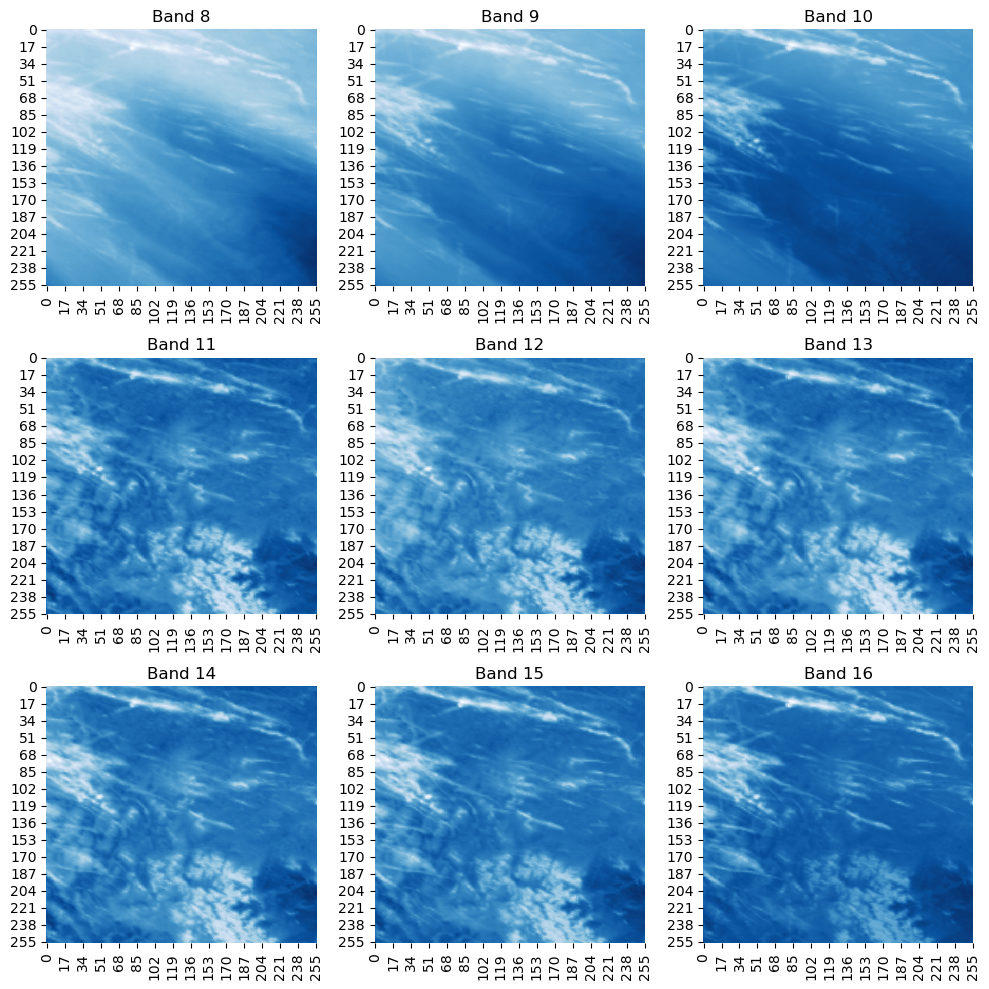

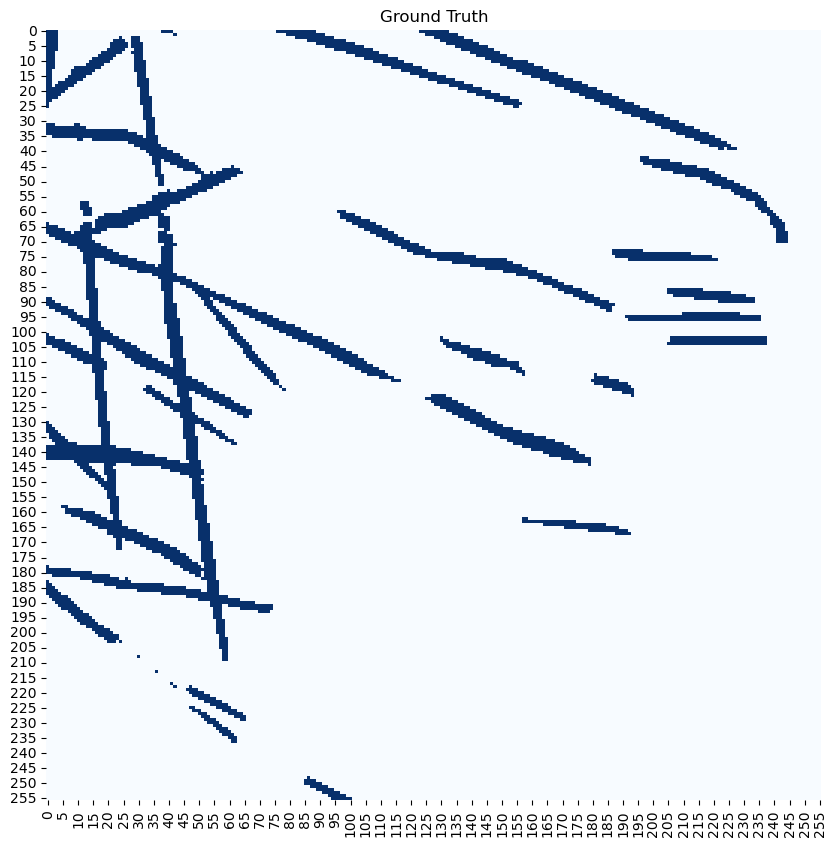

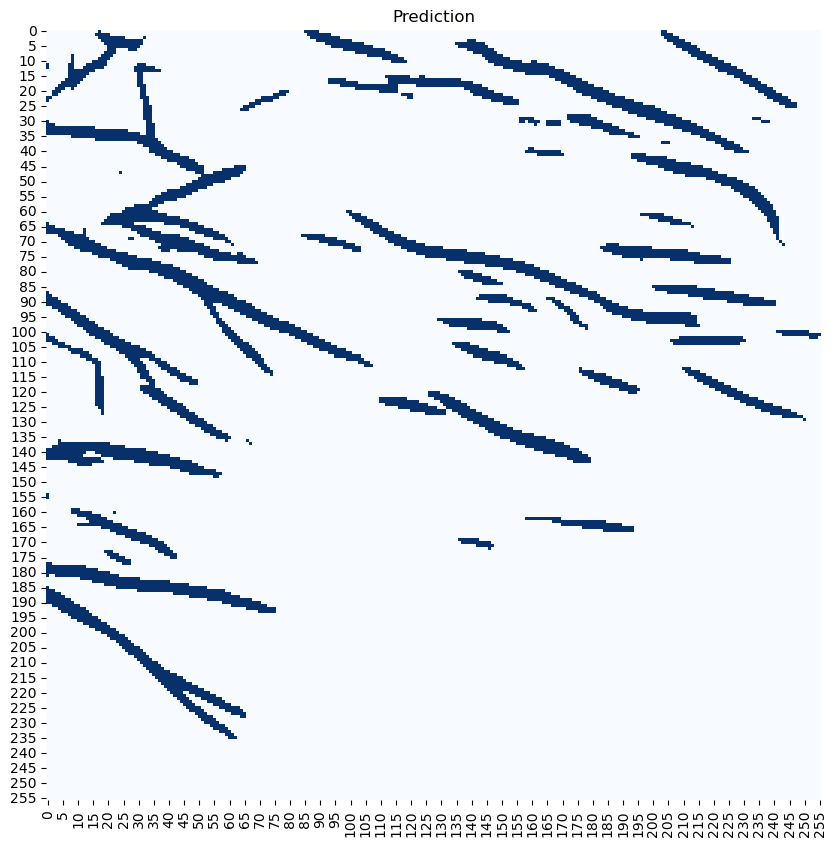

Dice Coefficient - Original: 0.62290358543396
Jacard Coefficient - Original: 0.45236584544181824


In [34]:
visualize_prediction(one_sample_folder_path, best_model)

# generate random subfolder paths for predictions

In [35]:
import random


def generate_random_subfolder_paths(folder_path, num_paths=5):
    subfolders = [f for f in os.listdir(folder_path) if os.path.isdir(os.path.join(folder_path, f))]
    
    # Separate subfolders into two lists: those with human_pixel_masks.npy containing both 0s and 1s, and those with only 0s
    subfolders_with_contrails = []
    subfolders_without_contrails = []

    for subfolder in subfolders:
        try:
            masks_path = os.path.join(folder_path, subfolder, 'human_pixel_masks.npy')
            masks = np.load(masks_path)
            if np.sum(masks) > 0:
                subfolders_with_contrails.append(subfolder)
            else:
                subfolders_without_contrails.append(subfolder)
        except:
            continue

    # Determine the number of paths to generate from each list
    num_paths_with_contrails = num_paths // 2 + num_paths % 2
    num_paths_without_contrails = num_paths // 2

    # Generate the paths
    subfolder_paths_with_contrails = random.sample(subfolders_with_contrails, min(num_paths_with_contrails, len(subfolders_with_contrails)))
    subfolder_paths_without_contrails = random.sample(subfolders_without_contrails, min(num_paths_without_contrails, len(subfolders_without_contrails)))

    subfolder_paths = [os.path.join(folder_path, subfolder) for subfolder in subfolder_paths_with_contrails + subfolder_paths_without_contrails]
    
    print("Subfolders' ids:")
    for path in subfolder_paths:
        print(os.path.basename(path))

    return subfolder_paths


# plot predictions and averaged predictions for layer 5 from given random subfolders

In [36]:
def predict_contrails_avg(model, folder_path):
    band_images = preprocess_band_files_simple(folder_path)
    band_images = np.expand_dims(band_images, axis=0)  # Add a batch dimension

    p0 = model.predict(band_images)[0, ..., 0]  # Original prediction

    # Flip image left-right, make a prediction, then unflip the prediction
    band_images_lr = np.flip(band_images, axis=2)
    p1 = model.predict(band_images_lr)[0, ..., 0]
    p1 = np.flip(p1, axis=1) 

    # Flip image up-down, make a prediction, then unflip the prediction
    band_images_ud = np.flip(band_images, axis=1)
    p2 = model.predict(band_images_ud)[0, ..., 0]
    p2 = np.flip(p2, axis=0)

    # Flip image left-right and up-down, make a prediction, then unflip the prediction
    band_images_lr_ud = np.flip(np.flip(band_images, axis=2), axis=1)
    p3 = model.predict(band_images_lr_ud)[0, ..., 0]
    p3 = np.flip(np.flip(p3, axis=1), axis=0)

    # Average the predictions
    prediction_avg = (p0 + p1 + p2 + p3) / 4.0

    return p0, prediction_avg

def visualize_prediction_avg(folder_path, model, figsize=(10, 10), cmap='Blues', threshold=0.5):
    # Load the mask
    mask = np.load(f'{folder_path}/human_pixel_masks.npy')[:, :, 0]

    # Get the predicted masks
    p0, predicted_mask_avg = predict_contrails_avg(model, folder_path)
    
    p0_binary = (p0 > 0.5).astype(np.uint8)
    predicted_mask_avg_binary = (predicted_mask_avg > threshold).astype(np.uint8)
    
    # Visualize band images
    visualize_band_images(folder_path)
   
    fig, axes = plt.subplots(1, 3, figsize=(3*figsize[0], figsize[1]))
    titles = ['Ground Truth', 'Original Prediction', 'Averaged Prediction']
    images = [mask, p0_binary, predicted_mask_avg_binary]
    
    for ax, img, title in zip(axes.flat, images, titles):
        sns.heatmap(img, cmap='Blues', cbar=False, linewidths=0.0, ax=ax)
        ax.set_title(title)
    
    plt.tight_layout()
    plt.show()
    
    # Print dice coefficient and IoU for original and averaged prediction
    dice_original = dice_coef_pred(mask, p0_binary)
    dice_avg = dice_coef_pred(mask, predicted_mask_avg_binary)
    
    jacard_original = jacard_coef_pred(mask, p0_binary)
    jacard_avg = jacard_coef_pred(mask, predicted_mask_avg_binary)
    
    print(f"Dice Coefficient - Original: {dice_original}, Averaged: {dice_avg}")
    print(f"Jacard Coefficient - Original: {jacard_original}, Averaged: {jacard_avg}")



1/1 [==============================] - 1s 1s/step


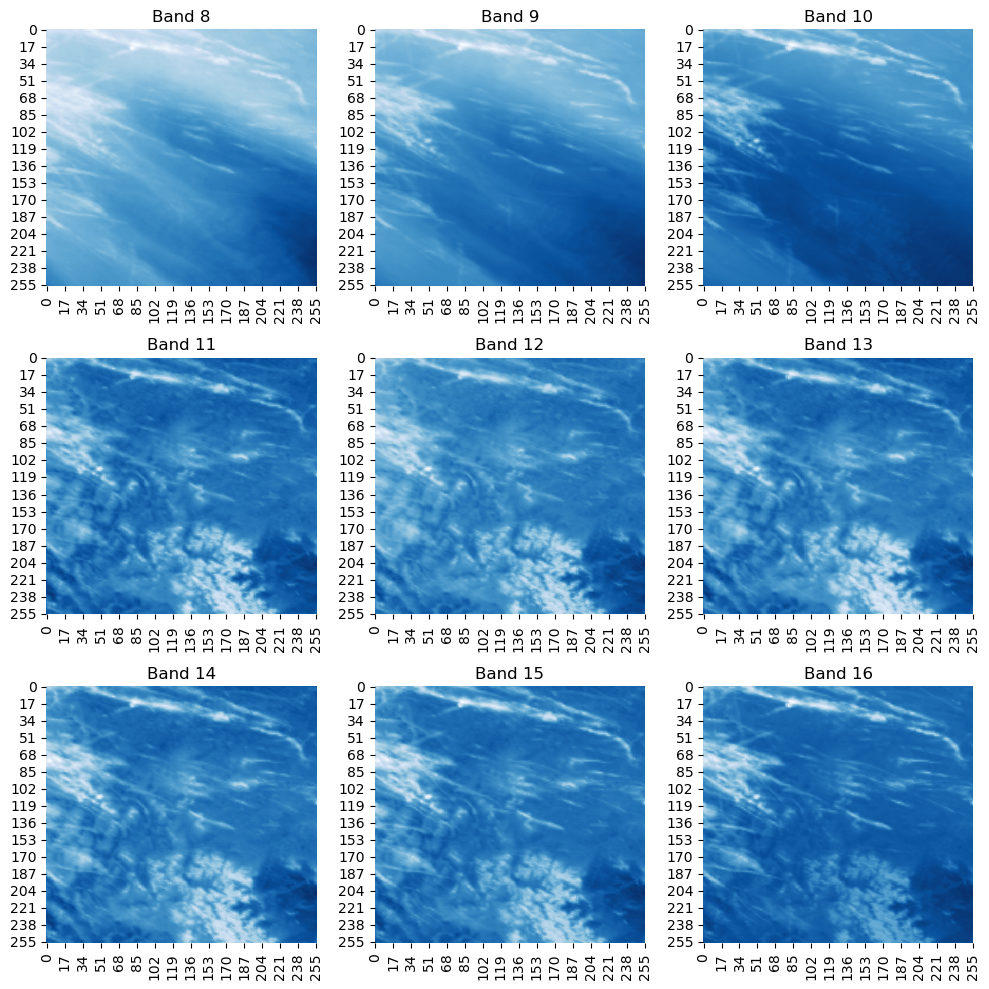

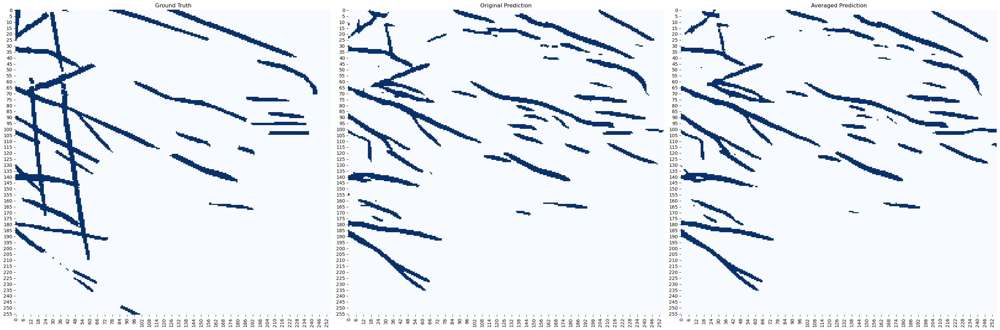

Dice Coefficient - Original: 0.62290358543396, Averaged: 0.6312366127967834
Jacard Coefficient - Original: 0.45236584544181824, Averaged: 0.4612080156803131


In [37]:
visualize_prediction_avg(one_sample_folder_path, best_model)


Subfolders' ids:
5906764568788964013
812710012232610717
1252523430208560617
942502957146677119
4591356257477068311
1/1 [==============================] - 1s 1s/step


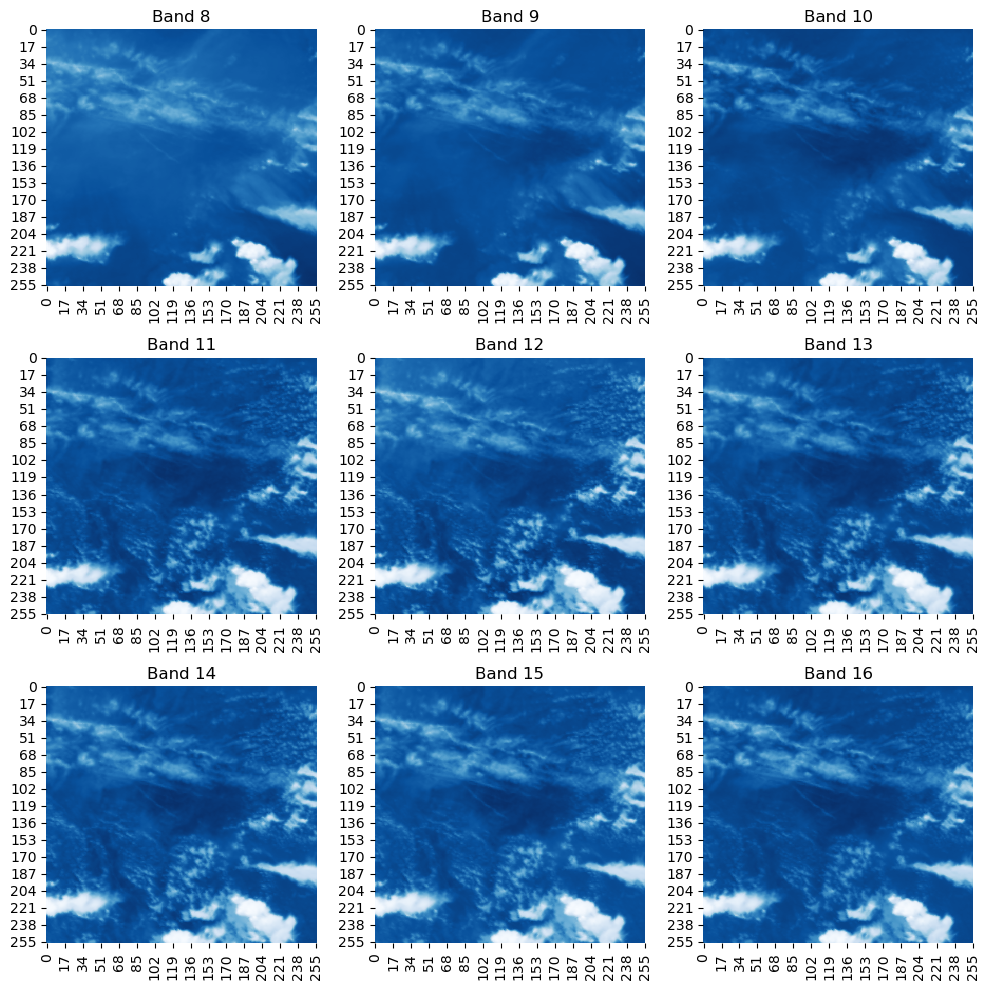

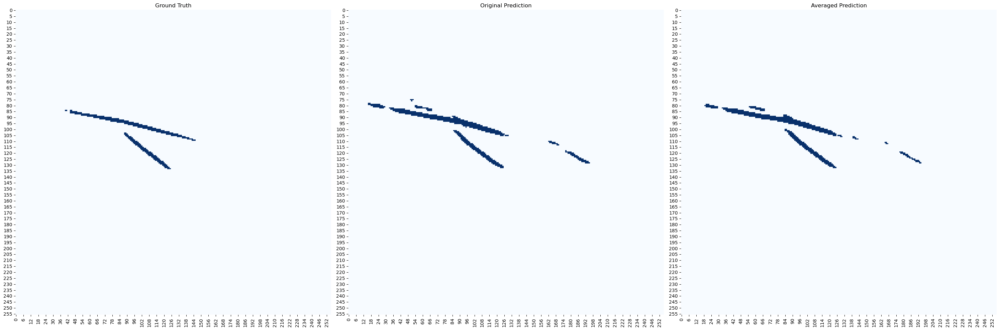

Dice Coefficient - Original: 0.6742700934410095, Averaged: 0.6949626803398132
Jacard Coefficient - Original: 0.5089408755302429, Averaged: 0.5328571200370789
Subfolder ID: 5906764568788964013
1/1 [==============================] - 1s 1s/step


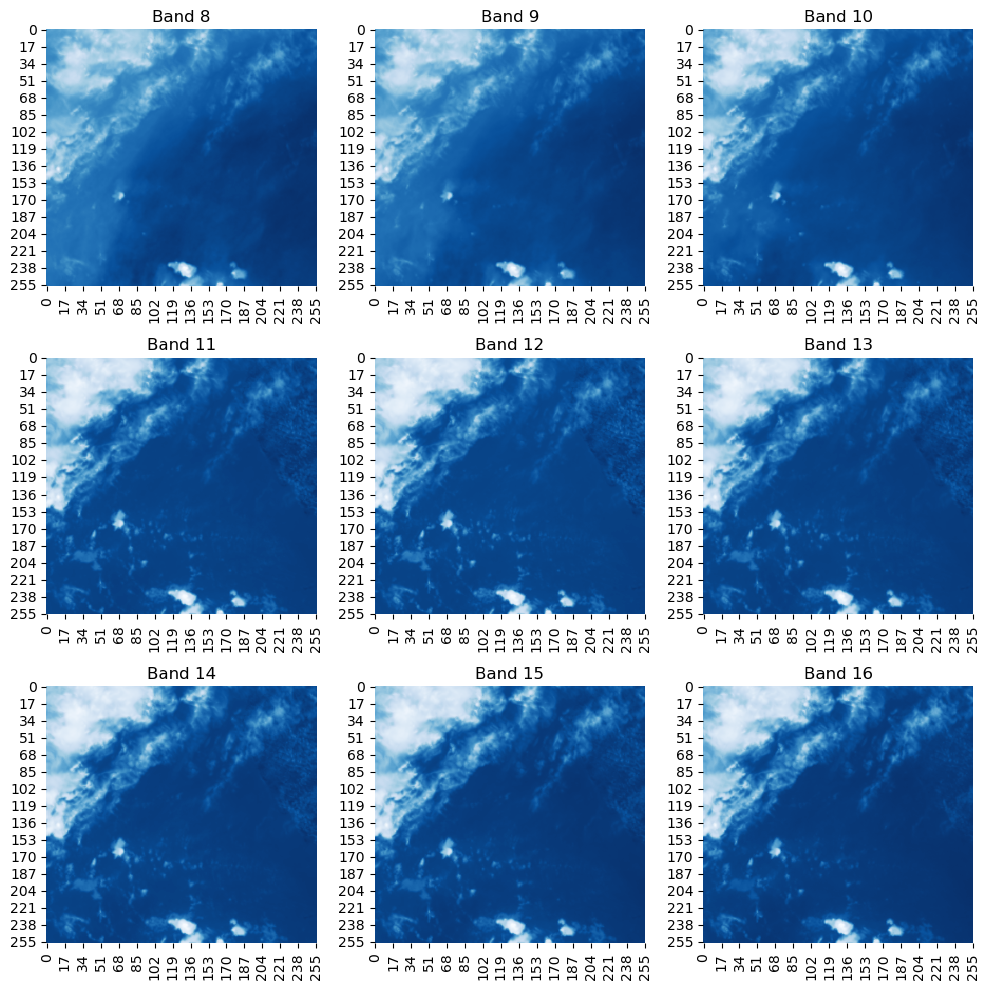

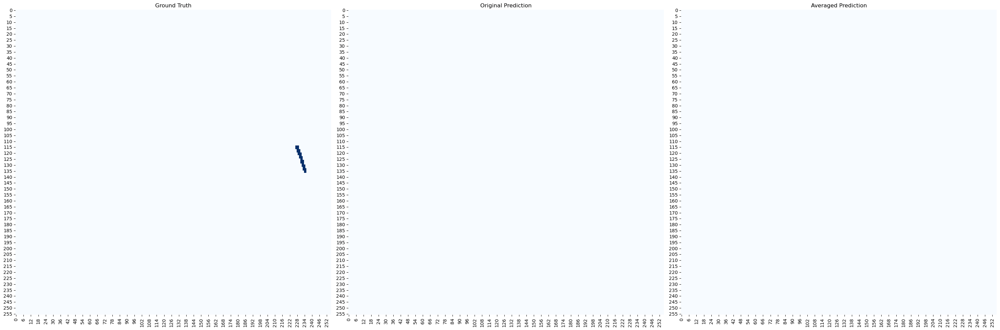

Dice Coefficient - Original: 0.015625, Averaged: 0.015625
Jacard Coefficient - Original: 0.015625, Averaged: 0.015625
Subfolder ID: 812710012232610717
1/1 [==============================] - 1s 1s/step


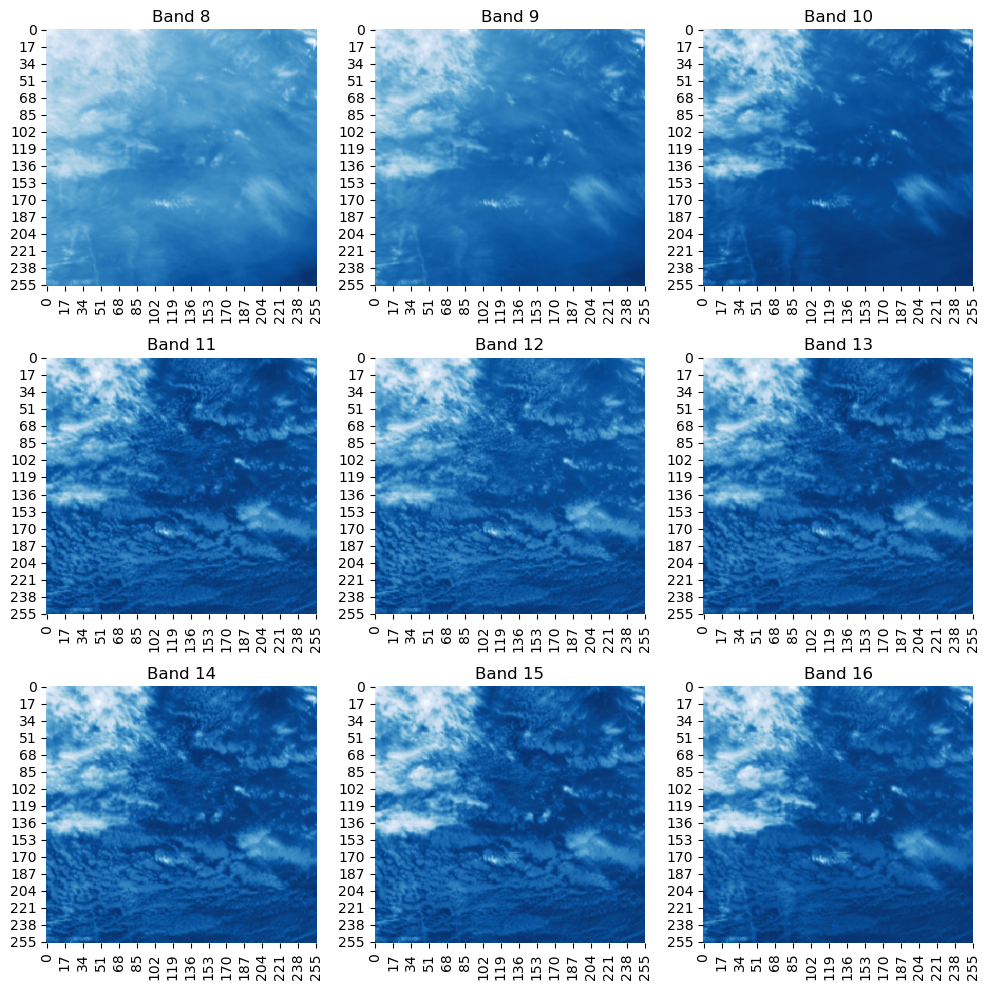

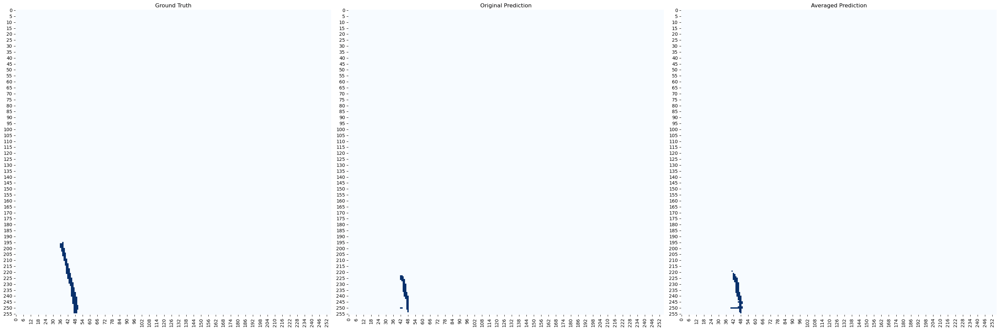

Dice Coefficient - Original: 0.5464683771133423, Averaged: 0.6130136847496033
Jacard Coefficient - Original: 0.37755101919174194, Averaged: 0.4433497488498688
Subfolder ID: 1252523430208560617
1/1 [==============================] - 1s 1s/step


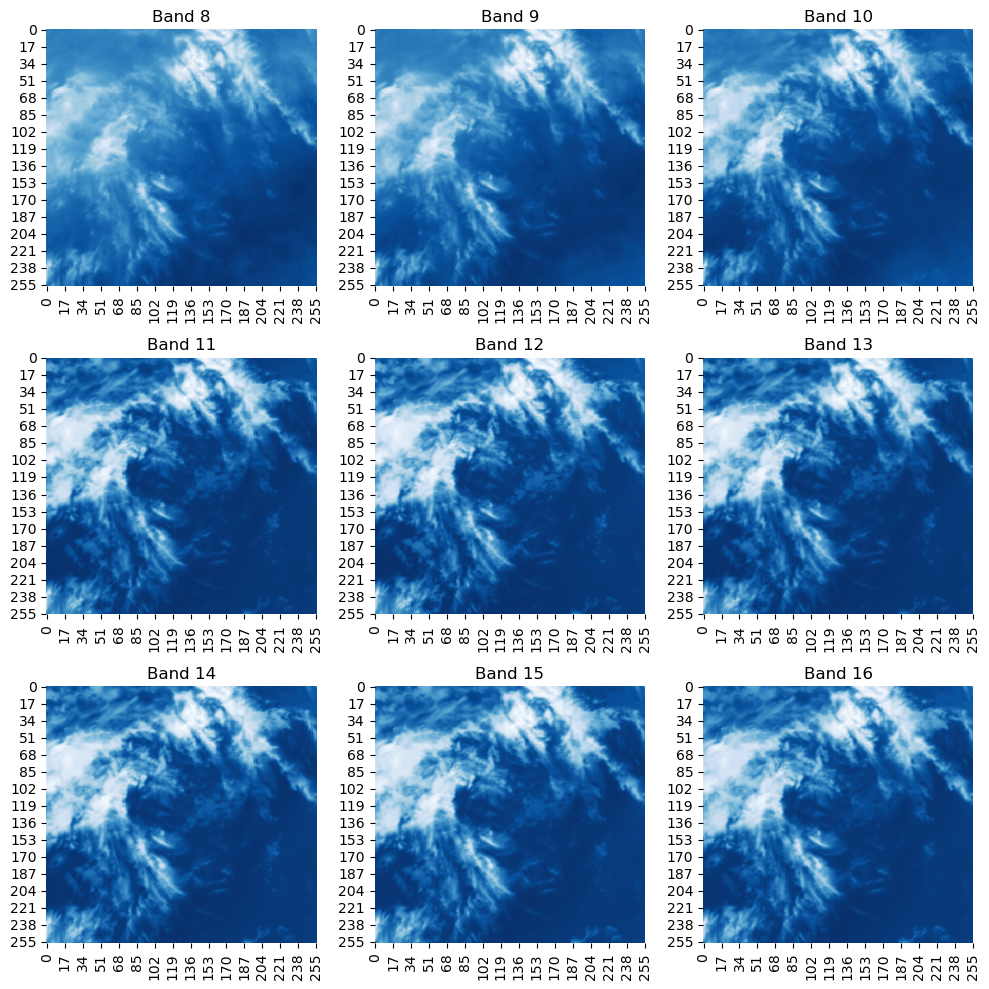

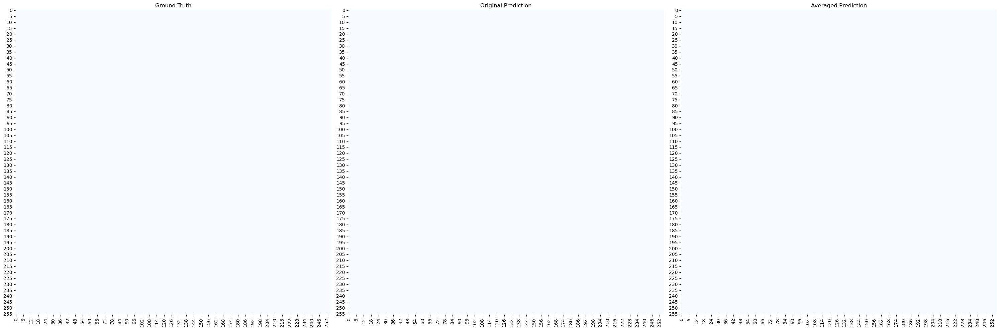

Dice Coefficient - Original: 1.0, Averaged: 1.0
Jacard Coefficient - Original: 1.0, Averaged: 1.0
Subfolder ID: 942502957146677119
1/1 [==============================] - 1s 1s/step


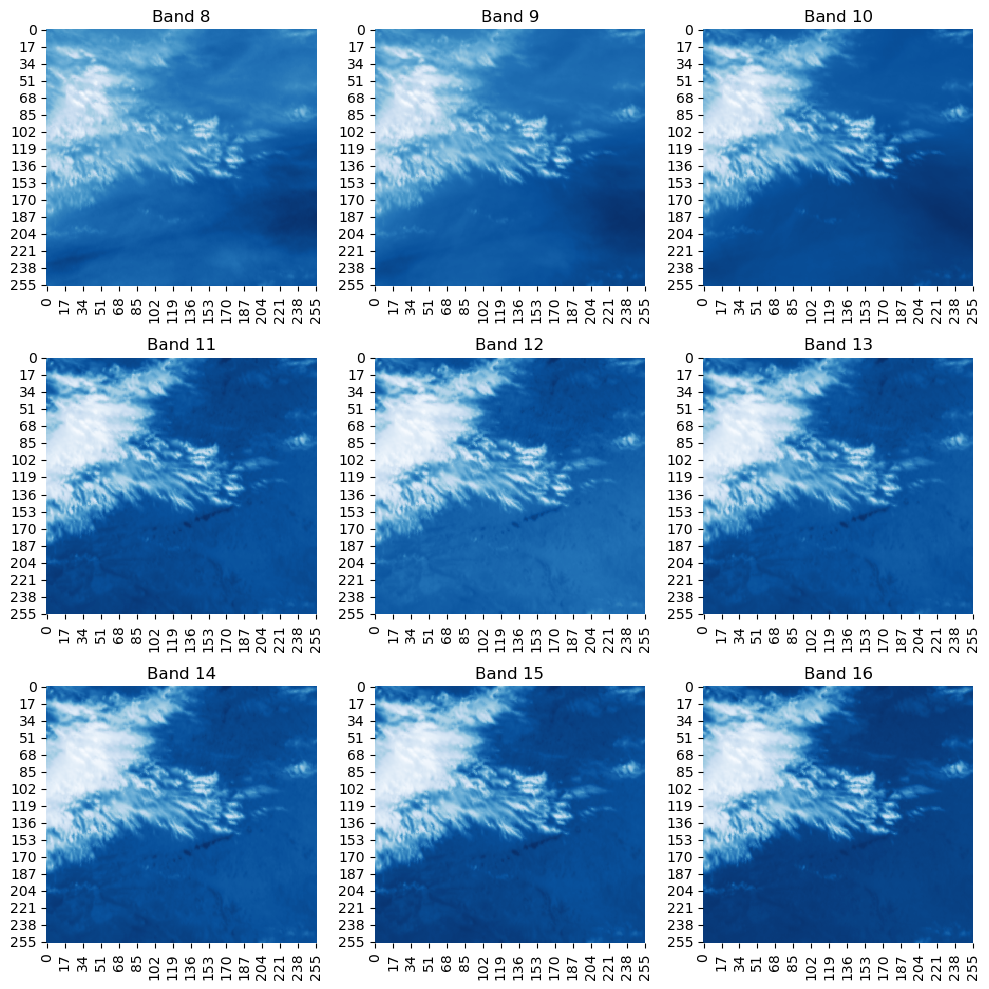

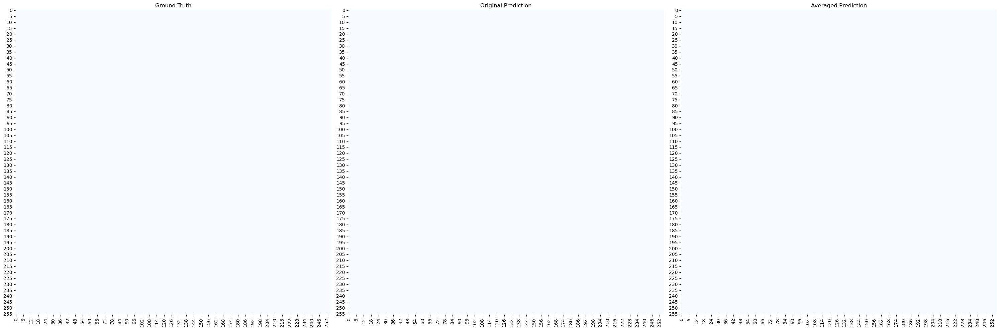

Dice Coefficient - Original: 1.0, Averaged: 1.0
Jacard Coefficient - Original: 1.0, Averaged: 1.0
Subfolder ID: 4591356257477068311


In [38]:
random_subfolders = generate_random_subfolder_paths(validation_folder)
for folder in random_subfolders:
    visualize_prediction_avg(folder, best_model)
    print(f"Subfolder ID: {os.path.basename(folder)}")


# plot predictions and averaged predictions for three layers: 4,5,6 from given random subfolders

In [39]:
def predict_contrails_avg_bi(model, band_images):
    # band_images should already have a batch dimension
    p0 = model.predict(band_images)[0, ..., 0]  # Original prediction

    # Flip image left-right, make a prediction, then unflip the prediction
    band_images_lr = np.flip(band_images, axis=2)
    p1 = model.predict(band_images_lr)[0, ..., 0]
    p1 = np.flip(p1, axis=1) 

    # Flip image up-down, make a prediction, then unflip the prediction
    band_images_ud = np.flip(band_images, axis=1)
    p2 = model.predict(band_images_ud)[0, ..., 0]
    p2 = np.flip(p2, axis=0)

    # Flip image left-right and up-down, make a prediction, then unflip the prediction
    band_images_lr_ud = np.flip(np.flip(band_images, axis=2), axis=1)
    p3 = model.predict(band_images_lr_ud)[0, ..., 0]
    p3 = np.flip(np.flip(p3, axis=1), axis=0)

    # Average the predictions
    prediction_avg = (p0 + p1 + p2 + p3) / 4.0

    return p0, prediction_avg

def preprocess_band_files_layer(folder_path, layer):
    band_file_paths = get_band_file_paths(folder_path)
    try:
        if not band_file_paths:
            # If no band files are found, return None or any appropriate value
            return None

        band_file_paths = [path for path in band_file_paths if path.endswith(("08.npy", "12.npy", "16.npy"))]
        band_images = [load_band_file(path)[..., layer] for path in band_file_paths]
        band_images = np.stack(band_images, axis=-1)
        band_images = (band_images - np.mean(band_images)) / np.std(band_images)
        return band_images

    except ValueError as e:
        # Handle the ValueError, you can print a message or perform any desired action
        print("Error: No band files found in the subfolder")
        return None


def visualize_prediction_avg_layers(folder_path, model, layers, figsize=(10, 10), cmap='Blues', threshold=0.5):
    # Load the mask
    mask = np.load(f'{folder_path}/human_pixel_masks.npy')[:, :, 0]

    # Visualize band images only once
    visualize_band_images(folder_path)
   
    for layer in layers:
        # Preprocess the band images
        band_images = preprocess_band_files_layer(folder_path, layer)
        band_images = np.expand_dims(band_images, axis=0)  # Add a batch dimension

        # Get the predicted masks
        p0, predicted_mask_avg = predict_contrails_avg_bi(model, band_images)
        
        p0_binary = (p0 > 0.5).astype(np.uint8)
        predicted_mask_avg_binary = (predicted_mask_avg > threshold).astype(np.uint8)
        
        fig, axes = plt.subplots(1, 3, figsize=(3*figsize[0], figsize[1]))
        titles = ['Ground Truth', 'Original Prediction', 'Averaged Prediction']
        images = [mask, p0_binary, predicted_mask_avg_binary]
        
        for ax, img, title in zip(axes.flat, images, titles):
            sns.heatmap(img, cmap='Blues', cbar=False, linewidths=0.0, ax=ax)
            ax.set_title(f'{title} - Layer {layer+1}')
        
        plt.tight_layout()
        plt.show()
        
        # Print dice coefficient and IoU for original and averaged prediction
        dice_original = dice_coef_pred(mask, p0_binary)
        dice_avg = dice_coef_pred(mask, predicted_mask_avg_binary)
        
        jacard_original = jacard_coef_pred(mask, p0_binary)
        jacard_avg = jacard_coef_pred(mask, predicted_mask_avg_binary)
        
        print(f"Layer {layer+1}")
        print(f"Dice Coefficient - Original: {dice_original}, Averaged: {dice_avg}")
        print(f"Jacard Coefficient - Original: {jacard_original}, Averaged: {jacard_avg}")



Subfolders' ids:
8737665552621745418
1501528175573804219
9023287873919304118
1377746559112166911
547395089780402315


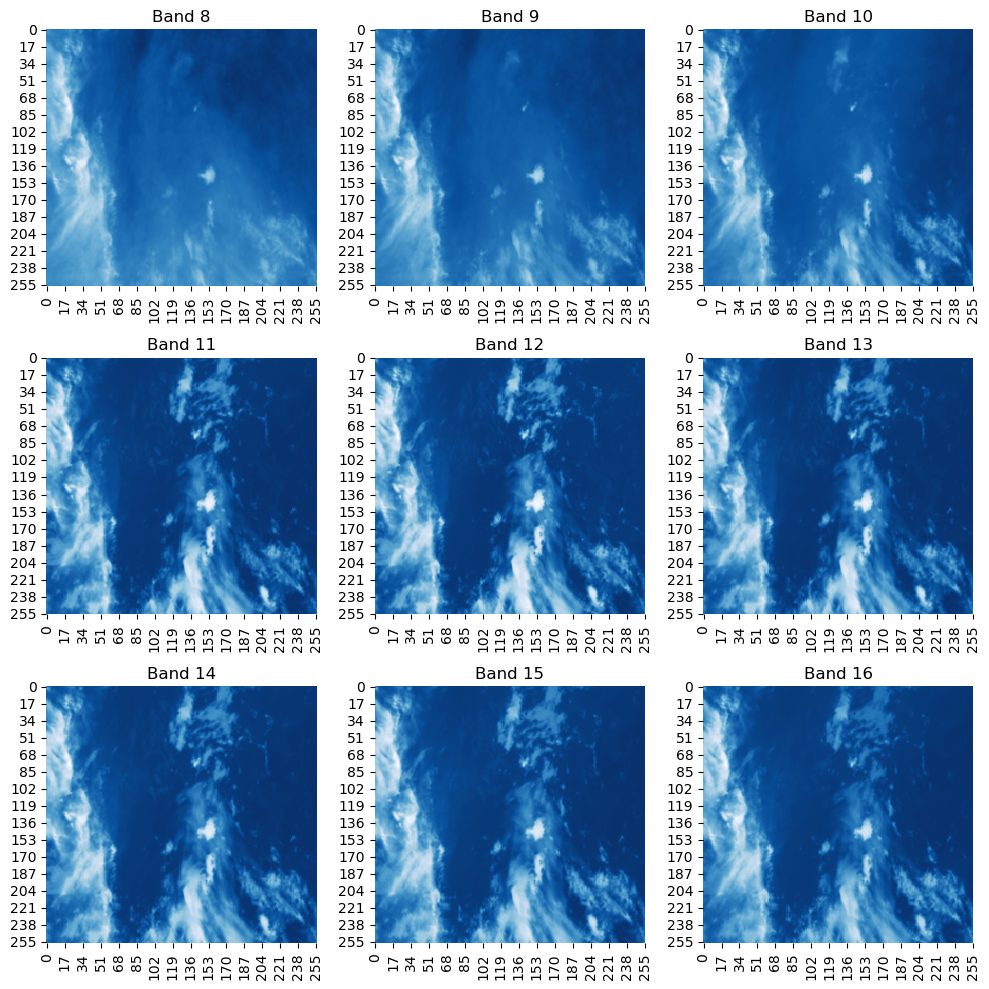

1/1 [==============================] - 1s 1s/step


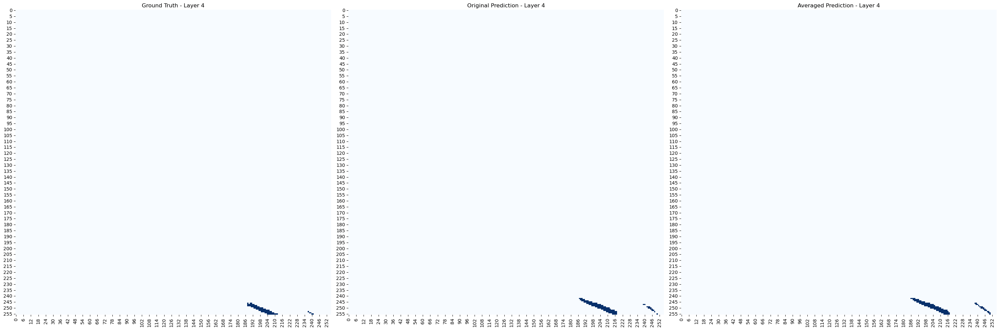

Layer 4
Dice Coefficient - Original: 0.004999999888241291, Averaged: 0.004854368977248669
Jacard Coefficient - Original: 0.004999999888241291, Averaged: 0.004854368977248669
1/1 [==============================] - 1s 1s/step


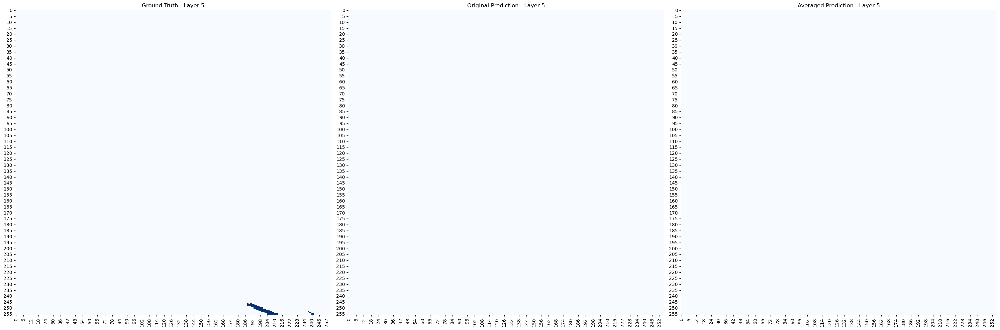

Layer 5
Dice Coefficient - Original: 0.012345679104328156, Averaged: 0.012345679104328156
Jacard Coefficient - Original: 0.012345679104328156, Averaged: 0.012345679104328156
1/1 [==============================] - 1s 1s/step


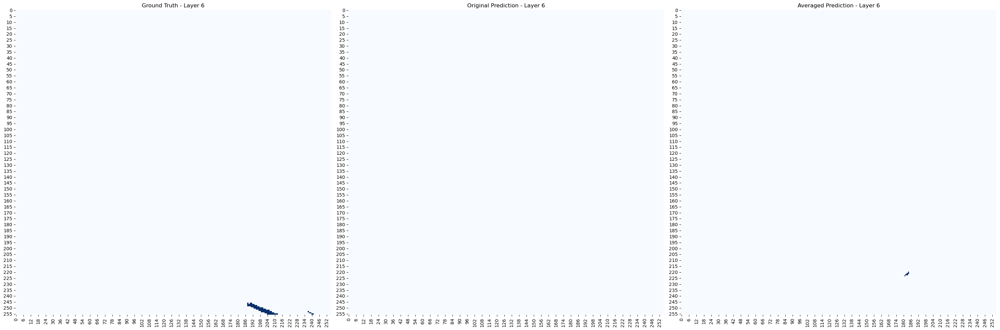

Layer 6
Dice Coefficient - Original: 0.012345679104328156, Averaged: 0.01149425283074379
Jacard Coefficient - Original: 0.012345679104328156, Averaged: 0.01149425283074379
Subfolder ID: 8737665552621745418


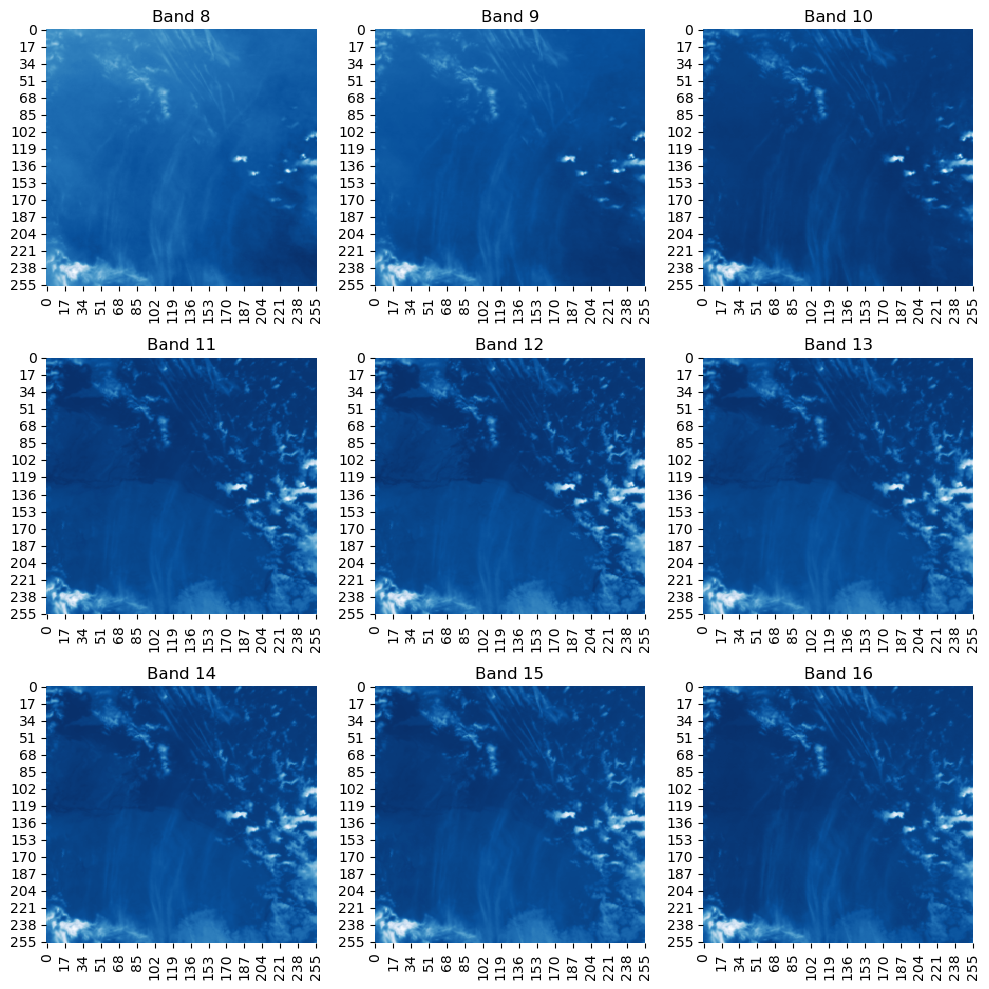

1/1 [==============================] - 1s 1s/step


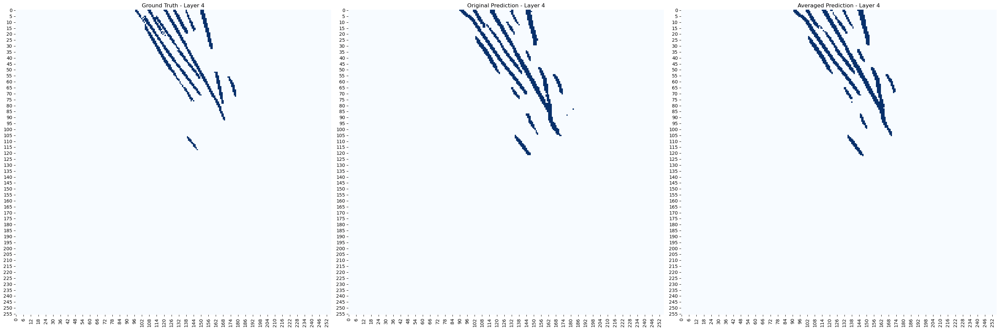

Layer 4
Dice Coefficient - Original: 0.12598752975463867, Averaged: 0.1479802131652832
Jacard Coefficient - Original: 0.06743566691875458, Averaged: 0.08010680973529816
1/1 [==============================] - 1s 1s/step


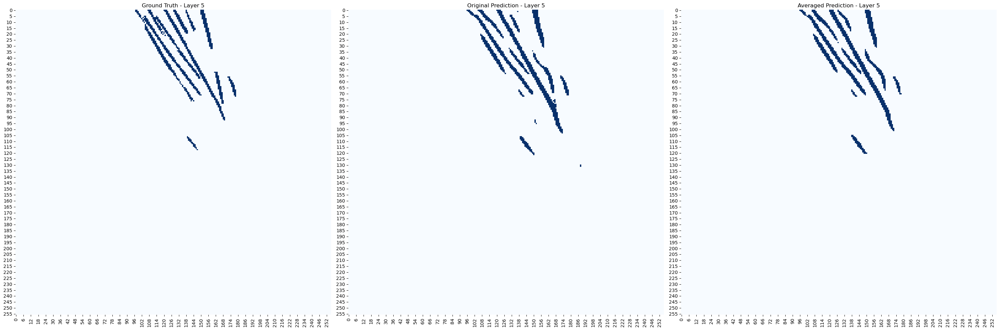

Layer 5
Dice Coefficient - Original: 0.7029960751533508, Averaged: 0.6972596645355225
Jacard Coefficient - Original: 0.5421686768531799, Averaged: 0.535380482673645
1/1 [==============================] - 1s 1s/step


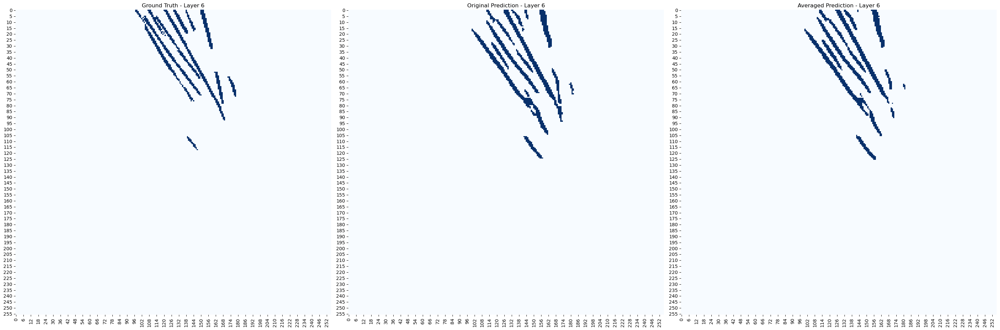

Layer 6
Dice Coefficient - Original: 0.11289674788713455, Averaged: 0.11460032314062119
Jacard Coefficient - Original: 0.060025542974472046, Averaged: 0.06098615750670433
Subfolder ID: 1501528175573804219


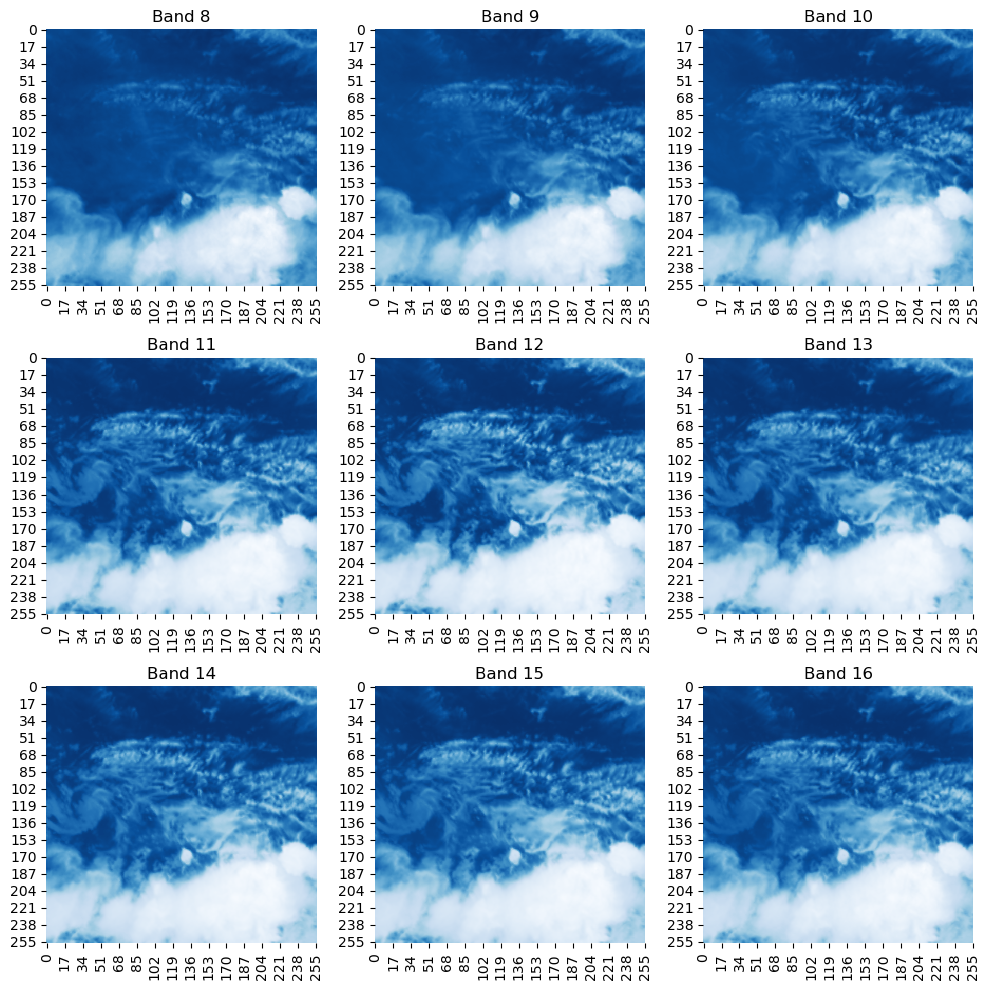

1/1 [==============================] - 1s 1s/step


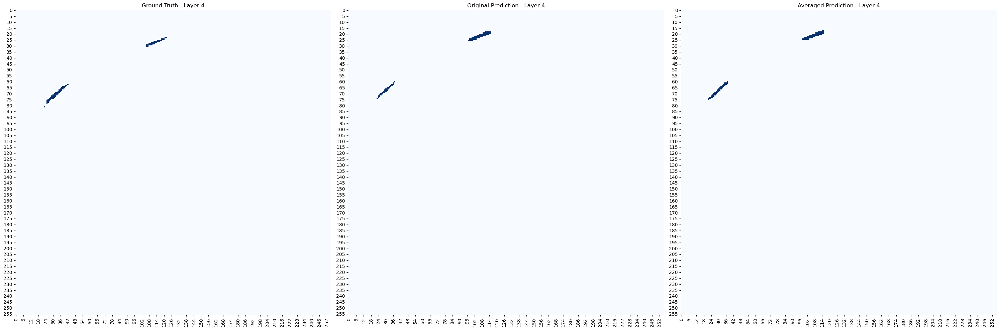

Layer 4
Dice Coefficient - Original: 0.005988024175167084, Averaged: 0.005649717524647713
Jacard Coefficient - Original: 0.005988024175167084, Averaged: 0.005649717524647713
1/1 [==============================] - 1s 1s/step


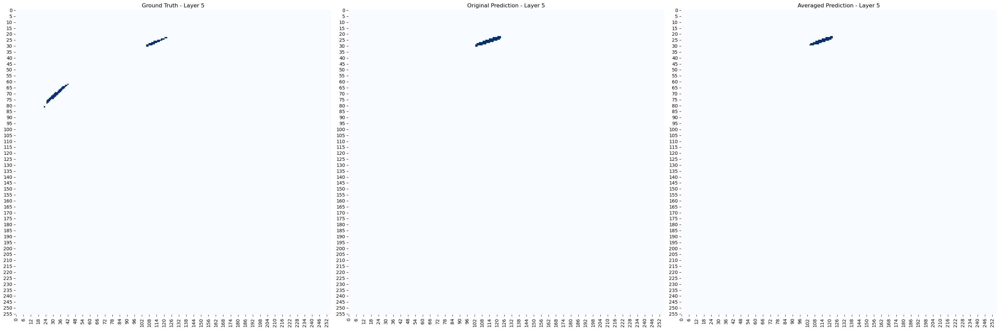

Layer 5
Dice Coefficient - Original: 0.36054420471191406, Averaged: 0.3629629611968994
Jacard Coefficient - Original: 0.22314049303531647, Averaged: 0.22522522509098053
1/1 [==============================] - 1s 1s/step


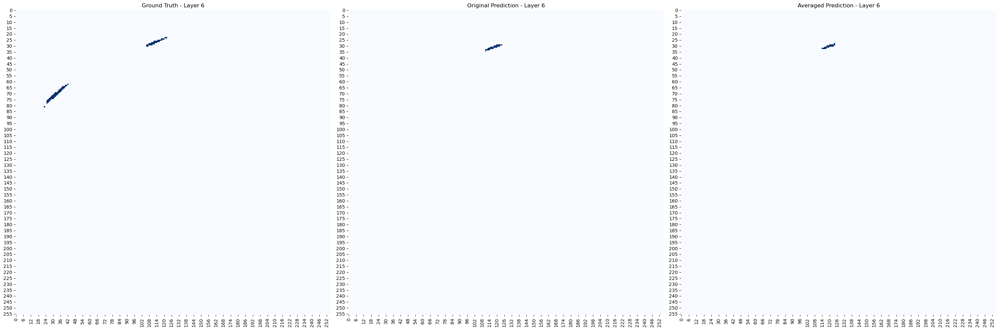

Layer 6
Dice Coefficient - Original: 0.00909090880304575, Averaged: 0.009615384973585606
Jacard Coefficient - Original: 0.00909090880304575, Averaged: 0.009615384973585606
Subfolder ID: 9023287873919304118


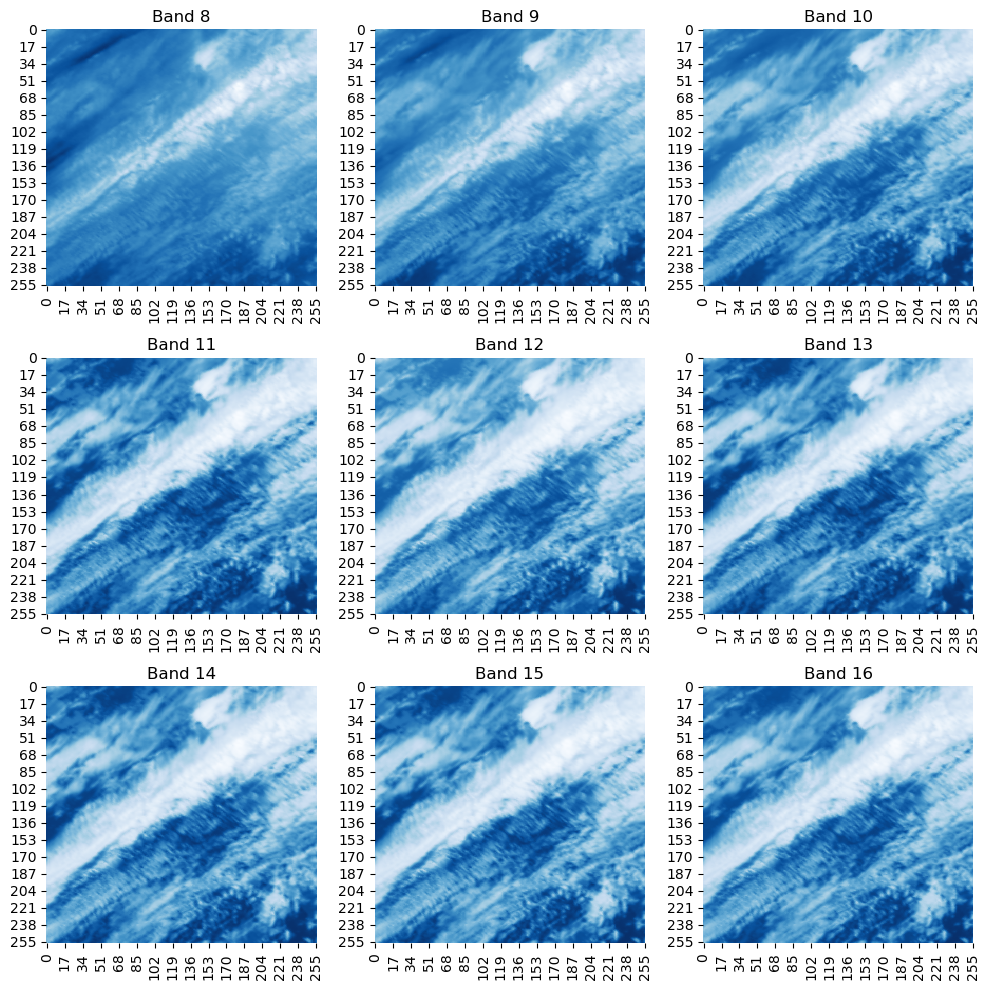

1/1 [==============================] - 1s 1s/step


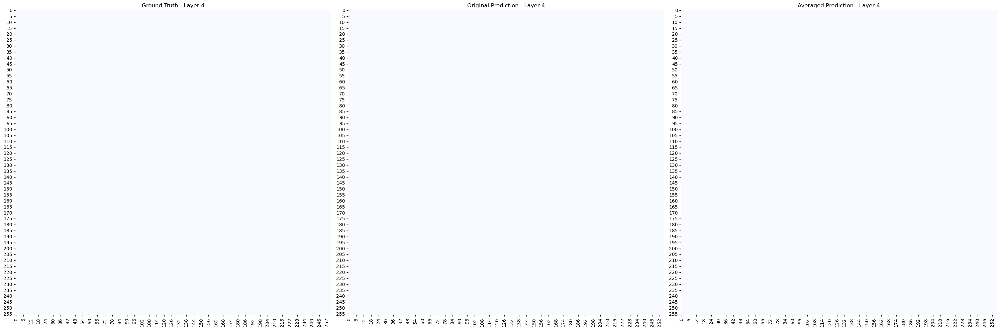

Layer 4
Dice Coefficient - Original: 1.0, Averaged: 1.0
Jacard Coefficient - Original: 1.0, Averaged: 1.0
1/1 [==============================] - 1s 1s/step


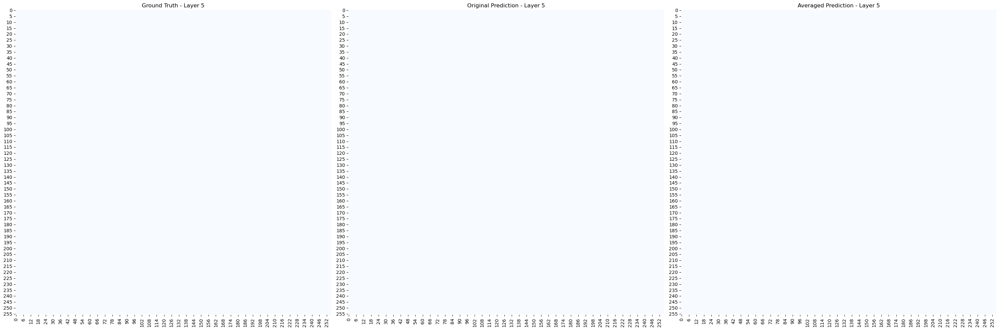

Layer 5
Dice Coefficient - Original: 1.0, Averaged: 1.0
Jacard Coefficient - Original: 1.0, Averaged: 1.0
1/1 [==============================] - 1s 1s/step


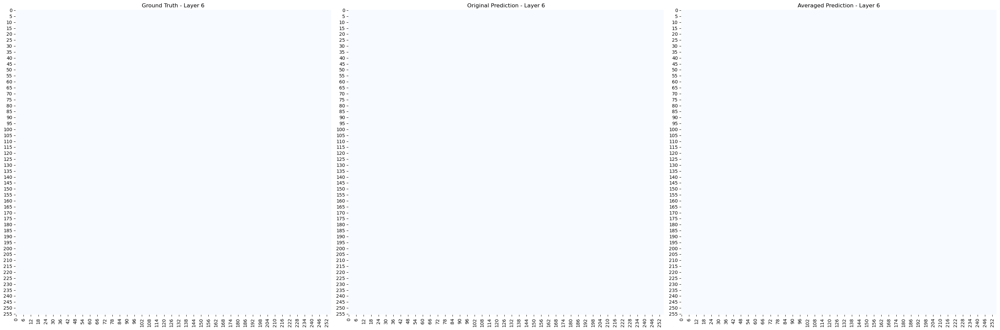

Layer 6
Dice Coefficient - Original: 1.0, Averaged: 1.0
Jacard Coefficient - Original: 1.0, Averaged: 1.0
Subfolder ID: 1377746559112166911


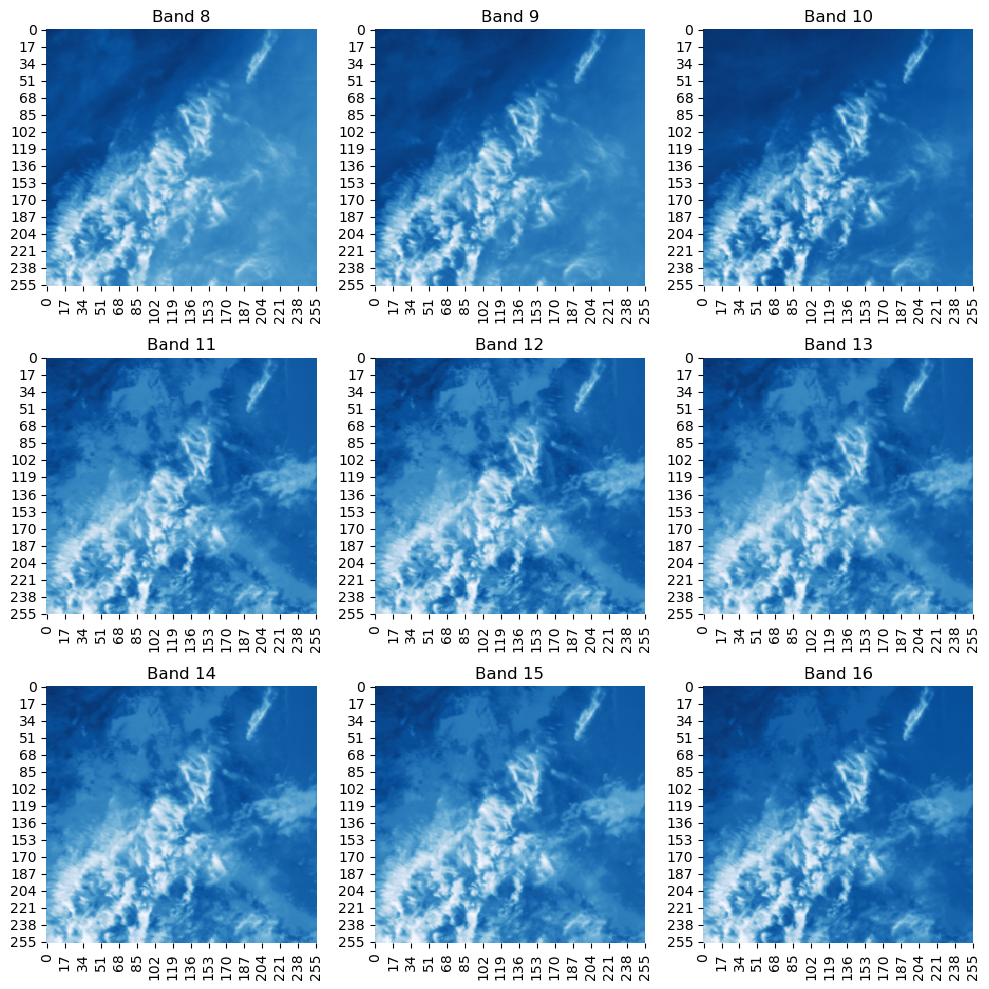

1/1 [==============================] - 1s 1s/step


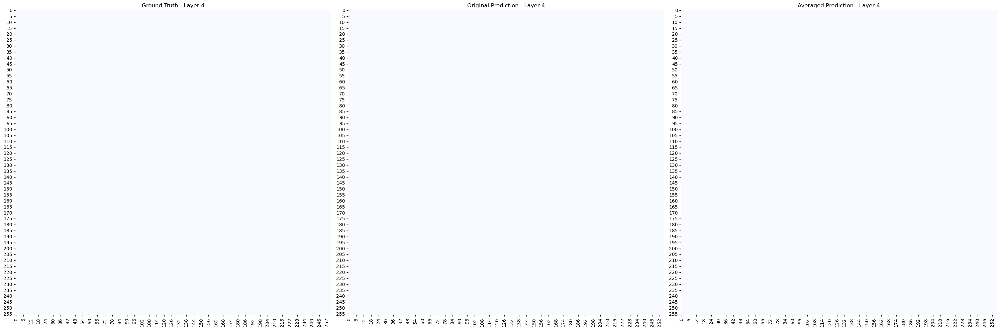

Layer 4
Dice Coefficient - Original: 1.0, Averaged: 1.0
Jacard Coefficient - Original: 1.0, Averaged: 1.0
1/1 [==============================] - 1s 1s/step


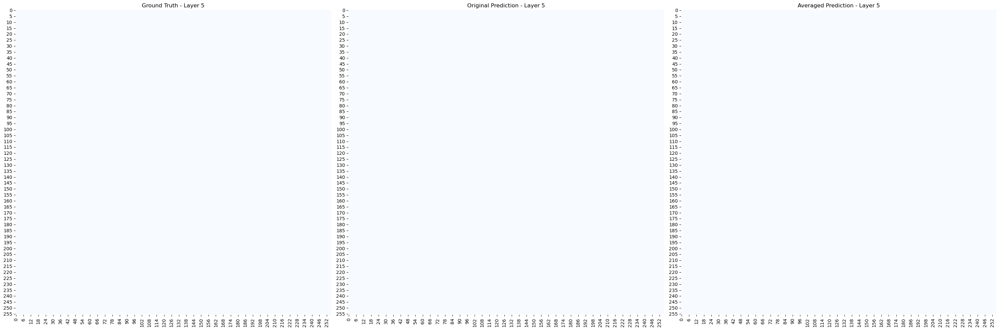

Layer 5
Dice Coefficient - Original: 1.0, Averaged: 1.0
Jacard Coefficient - Original: 1.0, Averaged: 1.0
1/1 [==============================] - 1s 1s/step


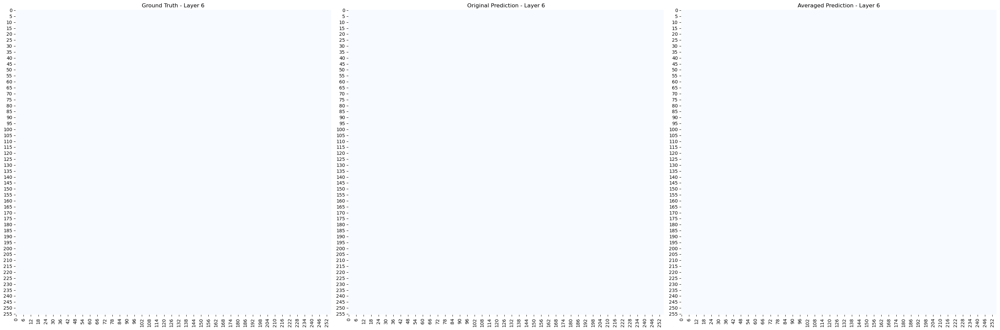

Layer 6
Dice Coefficient - Original: 1.0, Averaged: 1.0
Jacard Coefficient - Original: 1.0, Averaged: 1.0
Subfolder ID: 547395089780402315


In [40]:
random_subfolders = generate_random_subfolder_paths(validation_folder)
for folder in random_subfolders:
    visualize_prediction_avg_layers(folder, best_model, [3, 4, 5])  # 4th, 5th, 6th layers are 3, 4, 5 in zero-indexed Python
    print(f"Subfolder ID: {os.path.basename(folder)}")


# set function to remove contrails of less than 10 pixels

In [41]:
from scipy.ndimage import label, sum

def remove_small_contrails(prediction, min_size):
    # Label connected components
    labeled, num_contrails = label(prediction)

    # If there are no contrails, return the original prediction
    if num_contrails == 0:
        return prediction

    # Calculate the size of each contrail
    contrail_sizes = sum(prediction, labeled, range(1, num_contrails+1))

    # If all contrails are smaller than min_size, return an array of zeros
    if contrail_sizes.size == 0:
        return np.zeros_like(prediction)

    # Create a mask of the contrails that are too small
    too_small = contrail_sizes < min_size
    mask = too_small[labeled - 1]  # Subtract 1 from labeled as indices are zero-based

    # Remove small contrails
    cleaned_prediction = prediction.copy()
    cleaned_prediction[mask] = 0
    return cleaned_prediction


# plot cleaned predictions vs non-cleaned predictions

In [42]:
def visualize_prediction_avg_clean(folder_path, model, layers, min_size=10, figsize=(10, 10), cmap='Blues', threshold=0.5):
    # Load the mask
    mask = np.load(f'{folder_path}/human_pixel_masks.npy')[:, :, 0]

    # Visualize band images only once
    visualize_band_images(folder_path)
   
    for layer in layers:
        # Preprocess the band images
        band_images = preprocess_band_files_layer(folder_path, layer)
        band_images = np.expand_dims(band_images, axis=0)  # Add a batch dimension

        # Get the predicted masks
        p0, predicted_mask_avg = predict_contrails_avg_bi(model, band_images)
        
        p0_binary = (p0 > 0.5).astype(np.uint8)
        predicted_mask_avg_binary = (predicted_mask_avg > threshold).astype(np.uint8)
        
        # Remove small contrails from predictions
        p0_cleaned = remove_small_contrails(p0_binary, min_size)
        predicted_mask_avg_cleaned = remove_small_contrails(predicted_mask_avg_binary, min_size)

        fig, axes = plt.subplots(1, 5, figsize=(5*figsize[0], figsize[1]))
        titles = ['Ground Truth', 'Original Prediction', 'Averaged Prediction', 
                  'Cleaned Original Prediction', 'Cleaned Averaged Prediction']
        images = [mask, p0_binary, predicted_mask_avg_binary, p0_cleaned, predicted_mask_avg_cleaned]
        
        for ax, img, title in zip(axes.flat, images, titles):
            sns.heatmap(img, cmap='Blues', cbar=False, linewidths=0.0, ax=ax)
            ax.set_title(f'{title} - Layer {layer+1}')
        
        plt.tight_layout()
        plt.show()
        
        # Print dice coefficient and IoU for original, averaged, cleaned original, and cleaned averaged prediction
        dice_original = dice_coef_pred(mask, p0_binary)
        dice_avg = dice_coef_pred(mask, predicted_mask_avg_binary)
        dice_cleaned_original = dice_coef_pred(mask, p0_cleaned)
        dice_cleaned_avg = dice_coef_pred(mask, predicted_mask_avg_cleaned)

        jacard_original = jacard_coef_pred(mask, p0_binary)
        jacard_avg = jacard_coef_pred(mask, predicted_mask_avg_binary)
        jacard_cleaned_original = jacard_coef_pred(mask, p0_cleaned)
        jacard_cleaned_avg = jacard_coef_pred(mask, predicted_mask_avg_cleaned)
        
        print(f"Layer {layer+1}")
        print(f"Dice Coefficient - Original: {dice_original}, Averaged: {dice_avg}")
        print(f"Dice Coefficient - Cleaned Original: {dice_cleaned_original}, Cleaned Averaged: {dice_cleaned_avg}")
        print(f"Jacard Coefficient - Original: {jacard_original}, Averaged: {jacard_avg}")
        print(f"Jacard Coefficient - Cleaned Original: {jacard_cleaned_original}, Cleaned Averaged: {jacard_cleaned_avg}")




Subfolders' ids:
2859157867429222619
559329238677349618
5305149216115029013
3949057659878280318
5063760237182116216


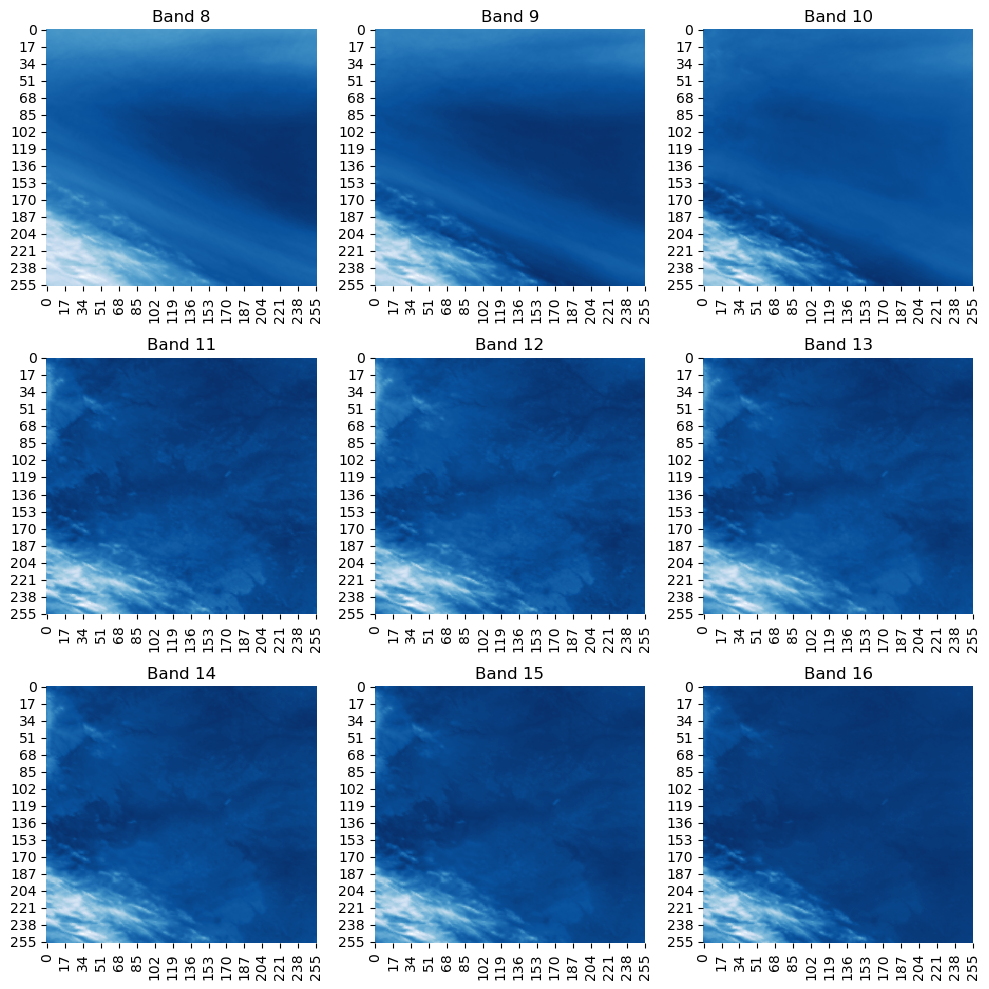

1/1 [==============================] - 1s 1s/step


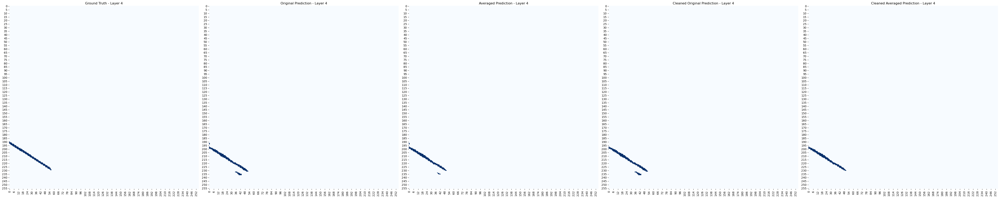

Layer 4
Dice Coefficient - Original: 0.00800000037997961, Averaged: 0.008547008968889713
Dice Coefficient - Cleaned Original: 0.002680965233594179, Cleaned Averaged: 0.0029154520016163588
Jacard Coefficient - Original: 0.005347593687474728, Averaged: 0.0057142856530845165
Jacard Coefficient - Cleaned Original: 0.002680965233594179, Cleaned Averaged: 0.0029154520016163588
1/1 [==============================] - 2s 2s/step


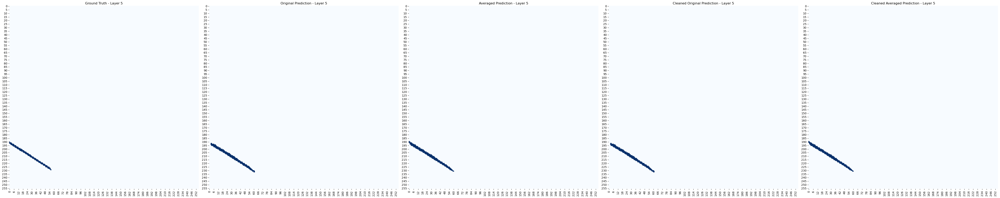

Layer 5
Dice Coefficient - Original: 0.8033573031425476, Averaged: 0.8194774389266968
Dice Coefficient - Cleaned Original: 0.8033573031425476, Cleaned Averaged: 0.8194774389266968
Jacard Coefficient - Original: 0.671999990940094, Averaged: 0.694779098033905
Jacard Coefficient - Cleaned Original: 0.671999990940094, Cleaned Averaged: 0.694779098033905
1/1 [==============================] - 1s 1s/step


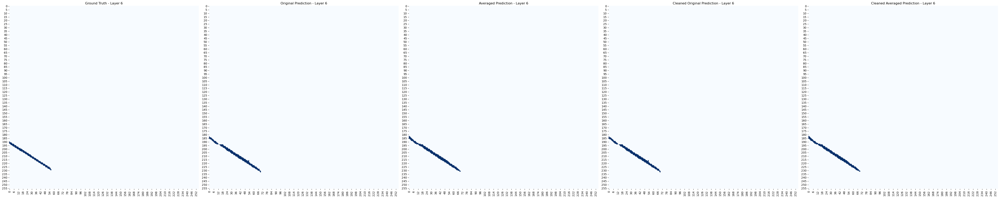

Layer 6
Dice Coefficient - Original: 0.0023255813866853714, Averaged: 0.0022675737272948027
Dice Coefficient - Cleaned Original: 0.0023255813866853714, Cleaned Averaged: 0.0022675737272948027
Jacard Coefficient - Original: 0.0023255813866853714, Averaged: 0.0022675737272948027
Jacard Coefficient - Cleaned Original: 0.0023255813866853714, Cleaned Averaged: 0.0022675737272948027
Subfolder ID: 2859157867429222619


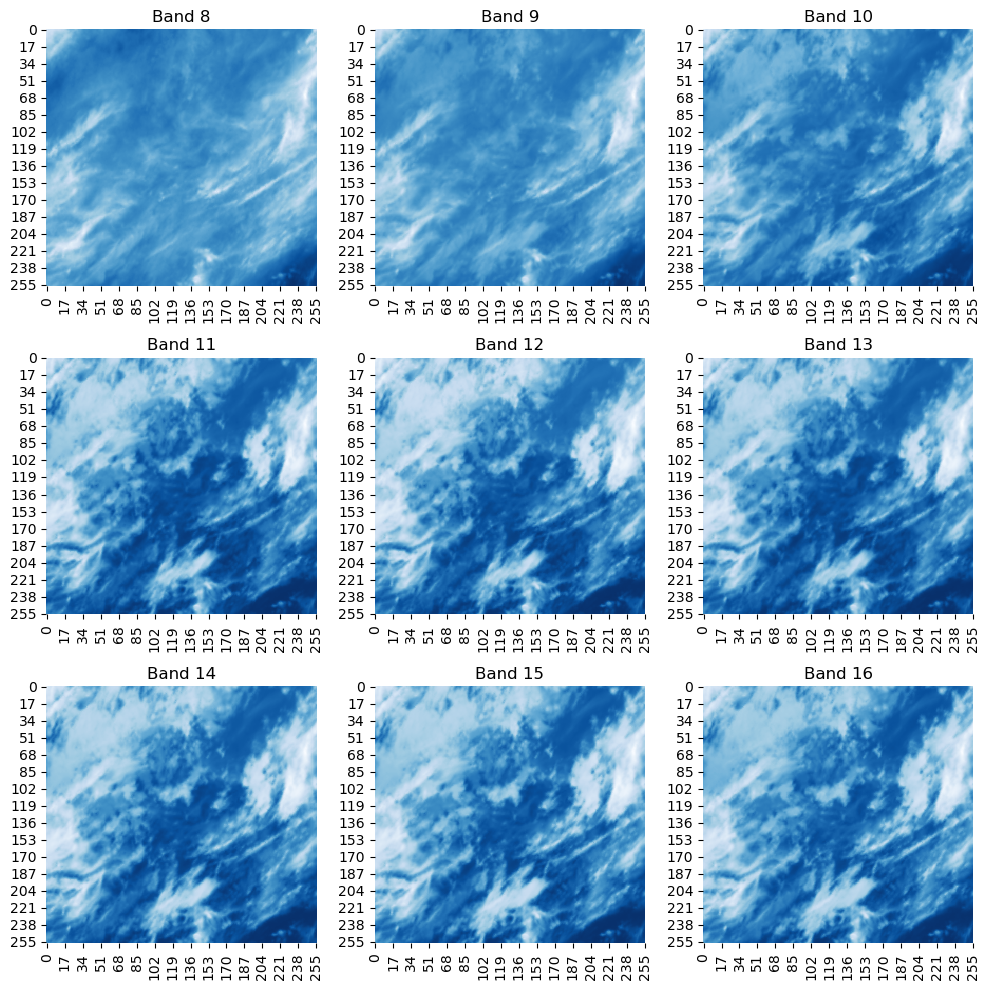

1/1 [==============================] - 1s 1s/step


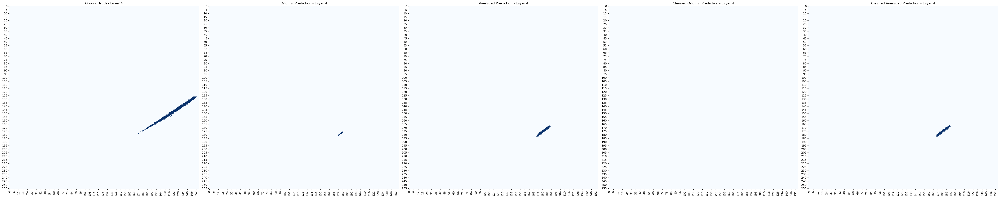

Layer 4
Dice Coefficient - Original: 0.0034129691775888205, Averaged: 0.11747851222753525
Dice Coefficient - Cleaned Original: 0.00358422938734293, Cleaned Averaged: 0.11747851222753525
Jacard Coefficient - Original: 0.0034129691775888205, Averaged: 0.06382978707551956
Jacard Coefficient - Cleaned Original: 0.00358422938734293, Cleaned Averaged: 0.06382978707551956
1/1 [==============================] - 1s 1s/step


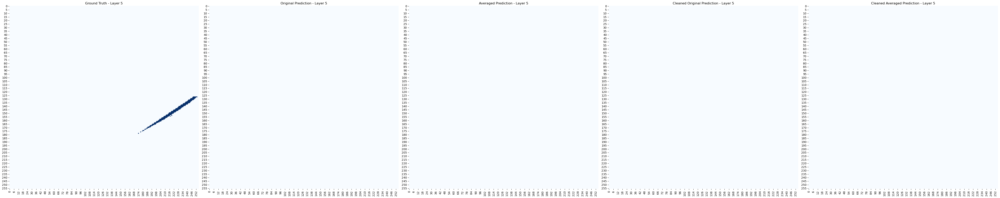

Layer 5
Dice Coefficient - Original: 0.00358422938734293, Averaged: 0.00358422938734293
Dice Coefficient - Cleaned Original: 0.00358422938734293, Cleaned Averaged: 0.00358422938734293
Jacard Coefficient - Original: 0.00358422938734293, Averaged: 0.00358422938734293
Jacard Coefficient - Cleaned Original: 0.00358422938734293, Cleaned Averaged: 0.00358422938734293
1/1 [==============================] - 1s 1s/step


In [ ]:
random_subfolders = generate_random_subfolder_paths(validation_folder)
for folder in random_subfolders:
    visualize_prediction_avg_clean(folder, best_model, [3, 4, 5])  # 4th, 5th, 6th layers are 3, 4, 5 in zero-indexed Python
    print(f"Subfolder ID: {os.path.basename(folder)}")

# calculate staightforward predictions

In [ ]:
# from keras import backend as K

# def calculate_metrics_on_large_scale(validation_folder, model, batch_size, num_batches, threshold=0.5):
#     # Create a data generator for validation data
#     validation_generator = data_generator_random_augmented(validation_folder, batch_size)

#     # Initialize lists to store Dice and IoU scores
#     dice_scores = []
#     iou_scores = []

#     # Process the specified number of batches
#     for i in range(num_batches):
#         X_val, y_val_true = next(validation_generator)
#         y_val_pred = model.predict(X_val)

#         # Threshold predictions and convert to float
#         y_val_pred = np.where(y_val_pred > threshold, 1, 0).astype(np.float32)

#         # Convert ground truth masks to float
#         y_val_true = y_val_true.astype(np.float32)


#         # Flatten the masks
#         y_val_true_f = K.flatten(y_val_true)
#         y_val_pred_f = K.flatten(y_val_pred)

#         # Calculate and store Dice coefficient
#         intersection = K.sum(y_val_true_f * y_val_pred_f)
#         dice = (2.0 * intersection + 1.0) / (K.sum(y_val_true_f) + K.sum(y_val_pred_f) + 1.0)
#         dice_scores.append(K.eval(dice))

#         # Calculate and store IoU coefficient
#         iou = (intersection + 1.0) / (K.sum(y_val_true_f) + K.sum(y_val_pred_f) - intersection + 1.0)
#         iou_scores.append(K.eval(iou))

#     return dice_scores, iou_scores


In [ ]:
# dice_scores, iou_scores = calculate_metrics_on_large_scale(validation_folder, best_model, batch_size=8, num_batches=232)
# print("Average Dice coefficient for normal prediction:", np.mean(dice_scores))
# print("Average IoU coefficient for normal prediction:", np.mean(iou_scores))

# calculate averaged predictions

In [ ]:
# from keras import backend as K

# def predict_contrails_avg4(model, band_images):
    
#     p0 = model.predict(band_images)

#     # Flip images left-right, make predictions, then unflip the predictions
#     band_images_lr = np.flip(band_images, axis=2)
#     p1 = model.predict(band_images_lr)
#     p1 = np.flip(p1, axis=2)

#     # Flip images up-down, make predictions, then unflip the predictions
#     band_images_ud = np.flip(band_images, axis=1)
#     p2 = model.predict(band_images_ud)
#     p2 = np.flip(p2, axis=1)

#     # Flip images left-right and up-down, make predictions, then unflip the predictions
#     band_images_lr_ud = np.flip(np.flip(band_images, axis=2), axis=1)
#     p3 = model.predict(band_images_lr_ud)
#     p3 = np.flip(np.flip(p3, axis=2), axis=1)

#     # Average the predictions
#     prediction = (p0 + p1 + p2 + p3) / 4.0

#     return prediction

# def calculate_metrics_on_large_scale_avg4(validation_folder, model, batch_size, num_batches, threshold=0.5):
#     # Create a data generator for validation data
#     validation_generator = data_generator_random_augmented(validation_folder, batch_size)

#     # Initialize lists to store Dice and IoU scores
#     dice_scores = []
#     iou_scores = []

#     # Process the specified number of batches
#     for i in range(num_batches):
#         X_val, y_val_true = next(validation_generator)
#         y_val_pred = predict_contrails_avg4(model, X_val)

#         # Threshold predictions and convert to float
#         y_val_pred = np.where(y_val_pred > threshold, 1, 0).astype(np.float32)

#         # Convert ground truth masks to float
#         y_val_true = y_val_true.astype(np.float32)

#         # Flatten the masks
#         y_val_true_f = K.flatten(y_val_true)
#         y_val_pred_f = K.flatten(y_val_pred)

#         # Calculate and store Dice coefficient
#         intersection = K.sum(y_val_true_f * y_val_pred_f)
#         dice = (2.0 * intersection + 1.0) / (K.sum(y_val_true_f) + K.sum(y_val_pred_f) + 1.0)
#         dice_scores.append(K.eval(dice))

#         # Calculate and store IoU coefficient
#         iou = (intersection + 1.0) / (K.sum(y_val_true_f) + K.sum(y_val_pred_f) - intersection + 1.0)
#         iou_scores.append(K.eval(iou))

#     return dice_scores, iou_scores


In [ ]:
# dice_scores, iou_scores = calculate_metrics_on_large_scale_avg4(validation_folder, best_model, batch_size=8, num_batches=232)
# print("Average Dice coefficient for averaged predictions:", np.mean(dice_scores))
# print("Average IoU coefficient for averaged predictions:", np.mean(iou_scores))

# compare dice and IoU for straightforward vs averaged predictions

In [ ]:
from keras import backend as K

def predict_contrails_avg4(model, band_images):
    
    p0 = model.predict(band_images)

    # Flip images left-right, make predictions, then unflip the predictions
    band_images_lr = np.flip(band_images, axis=2)
    p1 = model.predict(band_images_lr)
    p1 = np.flip(p1, axis=2)

    # Flip images up-down, make predictions, then unflip the predictions
    band_images_ud = np.flip(band_images, axis=1)
    p2 = model.predict(band_images_ud)
    p2 = np.flip(p2, axis=1)

    # Flip images left-right and up-down, make predictions, then unflip the predictions
    band_images_lr_ud = np.flip(np.flip(band_images, axis=2), axis=1)
    p3 = model.predict(band_images_lr_ud)
    p3 = np.flip(np.flip(p3, axis=2), axis=1)

    # Average the predictions
    prediction = (p0 + p1 + p2 + p3) / 4.0

    return prediction

def calculate_metrics_for_normal_and_avg4(validation_folder, model, batch_size, num_batches, threshold=0.5):
    # Create a data generator for validation data
    validation_generator = data_generator_random_augmented(validation_folder, batch_size)

    # Initialize lists to store Dice and IoU scores for normal and averaged predictions
    dice_scores_normal = []
    iou_scores_normal = []
    dice_scores_avg4 = []
    iou_scores_avg4 = []

    # Process the specified number of batches
    for i in range(num_batches):
        X_val, y_val_true = next(validation_generator)

        # Make normal predictions
        y_val_pred_normal = model.predict(X_val)

        # Make averaged predictions
        y_val_pred_avg4 = predict_contrails_avg4(model, X_val)

        # Threshold predictions and convert to float
        y_val_pred_normal = np.where(y_val_pred_normal > threshold, 1, 0).astype(np.float32)
        y_val_pred_avg4 = np.where(y_val_pred_avg4 > threshold, 1, 0).astype(np.float32)

        # Convert ground truth masks to float
        y_val_true = y_val_true.astype(np.float32)

        # Flatten the masks
        y_val_true_f = K.flatten(y_val_true)
        y_val_pred_normal_f = K.flatten(y_val_pred_normal)
        y_val_pred_avg4_f = K.flatten(y_val_pred_avg4)

        # Calculate and store Dice coefficient for normal predictions
        intersection_normal = K.sum(y_val_true_f * y_val_pred_normal_f)
        dice_normal = (2.0 * intersection_normal + 1.0) / (K.sum(y_val_true_f) + K.sum(y_val_pred_normal_f) + 1.0)
        dice_scores_normal.append(K.eval(dice_normal))

        # Calculate and store Dice coefficient for averaged predictions
        intersection_avg4 = K.sum(y_val_true_f * y_val_pred_avg4_f)
        dice_avg4 = (2.0 * intersection_avg4 + 1.0) / (K.sum(y_val_true_f) + K.sum(y_val_pred_avg4_f) + 1.0)
        dice_scores_avg4.append(K.eval(dice_avg4))

        # Calculate and store IoU coefficient for normal predictions
        iou_normal = (intersection_normal + 1.0) / (K.sum(y_val_true_f) + K.sum(y_val_pred_normal_f) - intersection_normal + 1.0)
        iou_scores_normal.append(K.eval(iou_normal))

        # Calculate and store IoU coefficient for averaged predictions
        iou_avg4 = (intersection_avg4 + 1.0) / (K.sum(y_val_true_f) + K.sum(y_val_pred_avg4_f) - intersection_avg4 + 1.0)
        iou_scores_avg4.append(K.eval(iou_avg4))

    return (dice_scores_normal, iou_scores_normal), (dice_scores_avg4, iou_scores_avg4)


In [ ]:
%%capture

(dice_scores_normal, iou_scores_normal), (dice_scores_avg4, iou_scores_avg4) = calculate_metrics_for_normal_and_avg4(validation_folder, best_model, batch_size=8, num_batches=232)
print("Average Dice coefficient for normal predictions:", np.mean(dice_scores_normal))
print("Average IoU coefficient for normal predictions:", np.mean(iou_scores_normal))
print("Average Dice coefficient for averaged predictions:", np.mean(dice_scores_avg4))
print("Average IoU coefficient for averaged predictions:", np.mean(iou_scores_avg4))
